In [8]:
from fastai.vision.widgets import *
from fastai.vision.all import *
import os

# Urls of all images imported

In [10]:
path = Path('bears')
bear_types={
"grizzly":('https://upload.wikimedia.org/wikipedia/commons/a/a9/GrizzlyBearJeanBeaufort.jpg','https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg','https://i.natgeofe.com/n/2abe83f4-7999-4ee0-8fa9-07330acdd30f/grizzly-bear_01.JPG?w=2880','https://blog.nwf.org/wp-content/blogs.dir/11/files/2015/12/white-collar_Pat-Roque-620x443.jpg','https://www.nczoo.org/sites/default/files/2021-12/Ronan_Grizzly_Bear_1.jpg','https://cdn.mos.cms.futurecdn.net/5TymxJoVZQPULQFvgydUZA.jpg','https://i.guim.co.uk/img/media/6dc9a1627ac2c6eafbfc0e08604be367bca60653/0_39_4571_2744/master/4571.jpg?width=1200','https://img.myloview.com.br/fotomurais/grizzly-bear-in-the-spring-700-170785364.jpg','https://media.istockphoto.com/photos/growling-grizzly-bear-picture-id485654673','https://c8.alamy.com/comp/DD066D/grizzly-bear-in-full-stride-DD066D.jpg','https://media.gettyimages.com/photos/kodiak-grizzly-bears-picture-id1181628709?s=170667a','https://media.istockphoto.com/photos/grizzly-bear-in-water-growling-mouth-open-picture-id1220985010?k=20','https://i.guim.co.uk/img/media/d6ff25af9b24b3325a5d2f3d65eac07a71bd70d4/0_201_3009_1805/master/3009.jpg?width=620','https://www.artmajeur.com/medias/hd/b/r/briansloanart/artwork/11105065_grizzly-bear-running-in-the-water-brian-sloan-artist.jpg','http://www.nwf.org/-/media/NEW-WEBSITE/Shared-Folder/Wildlife/Mammals/mammal_grizzy-bear_600x300.ashx','https://a57.foxnews.com/static.foxnews.com/foxnews.com/content/uploads/2019/10/1200/675/GrizzlyIstock-2.jpg?ve=1','https://images-na.ssl-images-amazon.com/images/I/A1k17hxbMML.jpg','https://img.freepik.com/premium-vector/portrait-brown-bear-head-from-splash-watercolor-hand-drawn-sketch-illustration-paints_291138-153.jpg?w=2000','https://images.immediate.co.uk/production/volatile/sites/23/2020/04/Grizzly-bear-50b5137-scaled.jpg','https://cdn.britannica.com/18/161718-050-2DB34DD6/Grizzly-bear.jpg','https://biv.com/sites/default/files/styles/media_image/public/2022-03/grizzly-getty-chriscanton.jpg?h=ecb8feda','https://cdn.cnn.com/cnnnext/dam/assets/211125112643-bart-the-bear-ii-super-tease.jpg','https://media.gettyimages.com/photos/grizzly-bear-at-the-detroit-zoo-in-royal-oak-michigan-on-may-26-2018-picture-id967841734?s=612x612','https://i.ytimg.com/vi/X3YFlan25LU/maxresdefault.jpg','https://i.natgeofe.com/n/93c79990-f63a-41cd-833c-8735bef41c82/01grizzlydelisting_4x3.jpg','https://www.outsideonline.com/wp-content/uploads/2019/11/15/menacing-bear-snarling_h.jpg','https://static.educalingo.com/img/en/800/grizzly-bear.jpg','https://images-na.ssl-images-amazon.com/images/I/61PSgkVDJAL._SY445_SX342_QL70_ML2_.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=100057402671465','https://media-cdn.tripadvisor.com/media/photo-s/14/43/c1/c0/grizzly-bear-ranch.jpg','https://www.cfc.umt.edu/grizzlybearrecovery/images/Bear ID.jpg','https://i.pinimg.com/564x/7a/ba/79/7aba79d631892fcdc2e9b21fb5c48a49.jpg','https://www.vmcdn.ca/f/files/rmotoday/images/51-north/mock/grizzly-2000.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/7/71/2010-kodiak-bear-1.jpg/1200px-2010-kodiak-bear-1.jpg','https://crosscut.com/sites/default/files/images/articles/200708_grizzlies_preservastion_trump.jpg','https://globalnews.ca/wp-content/uploads/2022/06/Yoho_grizzly2-Climbing-fence-photo-credit-Parks-Canada.jpg?quality=85','https://img.freepik.com/premium-photo/grizzly-bear-canada_548260-8.jpg?w=2000','https://www.cmzoo.org/wp-content/uploads/grizzlybear-digger.jpg','https://img.myloview.com.br/fotomurais/grizzly-bear-in-the-snow-700-225764865.jpg','https://www.terracestandard.com/wp-content/uploads/2022/03/28564681_web1_220331-GOS-boo_1.jpg','https://www.vmcdn.ca/f/files/rmotoday/2021/20210729/20210726-grizzly-bear-0197.jpg','https://westernwildlife.org/wp-content/uploads/2022/02/Grizzly-Bear-16x9-1.jpeg','https://wildlifeboss.com/wp-content/uploads/2022/03/grizzly-bear.webp','https://upload.wikimedia.org/wikipedia/commons/e/e3/Grizzly_Bear_(Ursus_arctos_ssp.).jpg','https://media.gettyimages.com/photos/grizzly-bear-at-the-detroit-zoo-in-royal-oak-michigan-on-may-26-2018-picture-id967842542?s=612x612','https://image.slidesharecdn.com/grizzlybear-100615201215-phpapp01/85/grizzly-bear-1-320.jpg?cb=1276633047','https://www.papo-france.com/439-thickbox_default/grizzly-bear.jpg','https://www.naturalworldsafaris.com/media/22505/st-alaska-grizzly-bear-shutterstock.png','https://bloximages.chicago2.vip.townnews.com/postregister.com/content/tncms/assets/v3/editorial/d/15/d15865e9-017f-51a4-b31a-cb8434fc5dfa/6149f67e9099a.image.png','https://www.nps.gov/common/uploads/nri/subject/bears/CE50DBDF-A969-A745-F0C0476E0B3637A1/CE50DBDF-A969-A745-F0C0476E0B3637A1.png','https://media.istockphoto.com/photos/grizzly-bear-in-alaska-in-autumn-picture-id1313483149?b=1','https://i.natgeofe.com/n/84d5ceb8-79dc-48e6-af24-ac8a9d0fed26/grizzly-bear_02_3x4.JPG','https://npr.brightspotcdn.com/dims4/default/87b3141/2147483647/strip/true/crop/1200x800 0 0/resize/880x587!/quality/90/?url=http://npr-brightspot.s3.amazonaws.com/legacy/sites/idaho/files/202104/43024639345_e235e3adfe_k.jpg','https://www.nczoo.org/sites/default/files/styles/hero_image_medium_/public/2021-07/Tommo_Grizzly_WebSized_0.jpg?h=7a5e2894','https://www.vitalground.org/wp-content/uploads/2021/12/iStock_SnowGrizLodgepole_HomepageSlider.jpg','https://image.shutterstock.com/image-photo/male-grizzly-bear-ursos-arctos-600w-60746689.jpg','https://animalcorner.org/wp-content/uploads/2015/02/grizzly-bear-1.jpg','https://defenders.org/sites/default/files/styles/meta_image/public/2019-05/grizzly-mother-cubs-jim-chagares-header.jpg?itok=3pBT-z3O','https://therevelator.org/wp-content/uploads/2021/11/Grizzly-road-Jim-Peaco-NPS.jpg','https://www.nathab.com/uploaded-files/carousels/HERO/Alaska-North/36-The-Great-Alaskan-Grizzly-Encounter.jpg','https://www.alaskapublic.org/wp-content/uploads/2020/09/d0352d12-1e58-4a23-b75d-29afb8a57d76Original-edited.jpg','https://cdn1.matadornetwork.com/blogs/1/2022/01/brown-bears-in-romania-bear-in-grass--1200x900.jpg','https://dailymontanan.com/wp-content/uploads/2021/08/grizzlyfeature_t.jpg','https://denverzoo.org/wp-content/uploads/2018/09/Grizzly-Bear_Thumb.jpg','https://static.onecms.io/wp-content/uploads/sites/20/2022/06/08/prizzly-bears-polar-and-grizzly.jpg','https://i.cbc.ca/1.6392421.1647892879!/fileImage/httpImage/grizzly-bear-manitoba.JPG','https://s.abcnews.com/images/Technology/WireAP_4e78d83d8c4e400c915d7553241bd4c2_16x9_992.jpg','https://ewscripps.brightspotcdn.com/dims4/default/2b0dabc/2147483647/strip/true/crop/1280x672 0 24/resize/1200x630!/quality/90/?url=https://ewscripps.brightspotcdn.com/b0/82/e97f14ff421ca8ca7d8692e0ecdb/generic-1280-1.png','https://www.nwpb.org/wp-content/uploads/2018/09/ap_18221700583150_wide-8485a73a449b2b371197afbde92558300f8cc90b.jpg','https://www.earthrangers.com/public/content/wildwire/tnc_88405621.jpg','https://sonoraresort.com/site/assets/files/4906/sonora-resort---grizzly-bear-tour---bear-with-salmon---2400x1154.2400x1029.webp','https://i.pinimg.com/736x/8f/7f/34/8f7f3419b2fcd8827f0cbaae46380e1d.jpg','https://www.science.org/do/10.1126/science.abl9306/abs/_20210812_on_grizzlybears_mainimage.jpg','https://i.ytimg.com/vi/AZCU2rFrVpY/maxresdefault.jpg','https://www.nps.gov/yell/learn/nature/images/griz_sow.jpg?maxwidth=1200','https://www.tradeinn.com/f/13755/137554133/safari-ltd-grizzly-bear-figure.jpg','https://naturecanada.ca/wp-content/uploads/2018/10/5-Grizzly-Bear-Facts-Blog-Credit-Howard-Trofanenko-e1550859064532.png','https://www.outdoorlife.com/uploads/2022/05/31/6a.-Full-Attack.jpg?auto=webp','https://i0.wp.com/boingboing.net/wp-content/uploads/2022/03/shutterstock_144478324-scaled.jpg?fit=2560,1700','https://deseret.brightspotcdn.com/dims4/default/8573500/2147483647/strip/true/crop/836x477 0 361/resize/1461x834!/quality/90/?url=https://cdn.vox-cdn.com/thumbor/JxQ4t7-Z_69dW3BP5Dj7ta3uDCc=/0x0:836x1200/836x1200/filters:focal(604x455:605x456)/cdn.vox-cdn.com/uploads/chorus_asset/file/17864186/1605049.jpg','https://www.vitalground.org/wp-content/uploads/2018/07/Grizzly-Country-2_Web_Robert-Scriba.jpg','https://pcweb.azureedge.net/-/media/pn-np/ab/jasper/WET4/nature/conservation/eep-sar/grizzly/grizzly-sar-banner_lrg_PC-V.jpg?modified=20211209204830','https://www.yellowstonepark.com/wp-content/uploads/2020/02/Bear-Grizzly-YS_TamJeffDukart_2400.jpg','https://m.media-amazon.com/images/I/51gQsoJZT-L._UXNaN_FMjpg_QL85_.jpg','https://static01.nyt.com/images/2017/06/23/science/23GRIZZLY/23GRIZZLY-articleLarge.jpg?quality=75','https://media.wltx.com/assets/WLTX/images/e28b64f5-332d-40a9-9730-3ded8d05d511/e28b64f5-332d-40a9-9730-3ded8d05d511_1140x641.jpg','https://images.dailyhive.com/20220615161332/injured-grizzly-bear.jpg','https://flatheadbeacon.com/wp-content/uploads/2020/12/20200824_GRIZ_0003.jpg','https://i.guim.co.uk/img/media/6dc9a1627ac2c6eafbfc0e08604be367bca60653/0_39_4571_2744/master/4571.jpg?width=1200','https://filson-life.imgix.net/2020/03/grizzly-bear-reintroduction-HERO.jpg?fit=crop','https://bgr.com/wp-content/uploads/2022/06/AdobeStock_1128405461.jpg?quality=82','https://yellowstonebearworld.com/wp-content/uploads/2020/12/grizzly-bear-3483887_640-300x214.jpg','https://cdn.pixabay.com/photo/2016/03/27/18/10/bear-1283347__480.jpg','https://ftw.usatoday.com/wp-content/uploads/sites/90/2022/05/grizzly_nps.jpeg?w=1000','https://i.insider.com/62263cc0990863001998ba2b?width=1136','https://www.austinadventures.com/wp-content/uploads/2019/03/AdobeStock_63547336.jpeg','https://www.earthrangers.com/public/content/wildwire/GrizzlyBear-project-image.jpg','https://www.backpacker.com/wp-content/uploads/2022/05/grizzly-wyoming.jpg','https://i0.wp.com/buckrail.com/wp-content/uploads/2022/05/50320918456_c23713b978_o.jpg?fit=2100,1400','http://blog.theclymb.com/wp-content/uploads/2014/09/angry-grizzly-bear.jpg','https://d9-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/styles/video_poster/public/thumbnails/video/youtube-X9nb0uO0LIM.jpg?itok=qy0_N82r','https://www.adventure-journal.com/wp-content/uploads/2022/05/Screen-Shot-2022-05-04-at-7.51.40-AM.png','https://www.history.com/.image/ar_4:3,c_fill,cs_srgb,fl_progressive,q_auto:good,w_1200/MTgxMTA5MzA1MDMzMzY4OTM2/bear-attacks-gettyimages-78725607.jpg','https://a-z-animals.com/media/2022/02/93e69a1bffd08bbdd6d40115ac543bd0d28d9d37-1024x439.jpg','https://www.fws.gov/sites/default/files/styles/banner_image_xs/public/banner_images/2021-04/natdiglib_1060_full.jpg?h=357c945e','https://media.timeout.com/images/105896570/image.jpg','https://i0.wp.com/conservationnw.org/wp-content/uploads/2020/03/JSW_6993-scaled.jpg?fit=2560,1744','https://c.files.bbci.co.uk/12A85/production/_119312467_gettyimages-1150480683-1.jpg','https://cdn.pixabay.com/photo/2016/03/27/18/10/bear-1283347__480.jpg','https://www.backpacker.com/wp-content/uploads/2022/05/grizzly-wyoming.jpg','https://thehill.com/wp-content/uploads/sites/2/2021/12/ca_montanagrizzlybearprotection_120721istock.jpg','https://cdn2.civitatis.com/estados-unidos/homer/galeria/crias-oso-grizzly-homer.jpg','https://www.bearsmart.com/wp-content/uploads/2015/01/why-bears3.jpg','https://files.worldwildlife.org/wwfcmsprod/images/Brown_Bear/hero_small/90xwf40q7o_HI_205165_brownbear.jpg','https://media.kidadl.com/grizzly_bear_claws_fascinating_facts_dc432ca07c.jpg','https://static01.nyt.com/images/2020/02/10/science/10SCI-GRIZZLIES01/10SCI-GRIZZLIES01-mediumSquareAt3X-v2.jpg','https://www.yukon-news.com/wp-content/uploads/2022/04/28655806_web1_3web-TravelersJournalPhraener-SEQ-22030323_1.jpg','https://media.9news.com/assets/KUSA/images/77e4b39d-a58c-48a6-b865-3cee4772e36b/77e4b39d-a58c-48a6-b865-3cee4772e36b_1920x1080.jpg','http://cdn.cnn.com/cnnnext/dam/assets/211007211315-01-bear-encounters-restricted.jpg','https://m.media-amazon.com/images/I/61PSgkVDJAL._SX260_.jpg','https://montanafreepress.org/wp-content/uploads/2019/03/Grizzly-Bear-Adobe-Stock-1170x780.jpg','https://fwp.mt.gov/binaries/content/gallery/mtfwpproject/fwpimageset/smallhero/conservation/tagged-grizzly_smallhero.jpg/tagged-grizzly_smallhero.jpg/mtfwpproject:HeroSmall','https://images.unsplash.com/photo-1551792714-9a8b35338793?ixlib=rb-1.2.1','https://s.abcnews.com/images/Technology/WireAP_4e78d83d8c4e400c915d7553241bd4c2_16x9_992.jpg','https://www.scotsman.com/webimg/b25lY21zOmU3OTA4NDliLTkzNmItNDAxOS04ZGQwLTkyZTcxZmQ5NWQ3MDo1Y2MzYWNiNi04NjZkLTQ5NGItYjc0YS1mYjczNmJiZmUwMTI=.jpg?width=640','https://media.springernature.com/full/springer-static/image/art:10.1038/s42003-019-0574-4/MediaObjects/42003_2019_574_Fig1_HTML.png','https://images.theconversation.com/files/264985/original/file-20190320-93048-1qbbivy.jpg?ixlib=rb-1.1.0','https://s3.wp.wsu.edu/uploads/sites/2797/2022/03/grizzly-bear-looking-for-apples.jpg','https://www.biologicaldiversity.org/assets/img/species/mammals/GrizzlyBearRobinSilver.jpg','https://upload.wikimedia.org/wikipedia/commons/f/fe/Adult_grizzly_bear,_Bute_Inlet.jpg','https://i.insider.com/62263cb0dcce010019a70e0c?width=700','https://lookaside.instagram.com/seo/google_widget/crawler/?media_id=2862317168462108770','https://homalcotours.com/wp-content/uploads/mp/image-cache/site/5/2015-67.ede091cc122b77679e948fc6cdf272f6.jpg','https://www.gannett-cdn.com/presto/2020/04/22/PGRF/1da46b56-81e7-4b93-84f4-8c3ee2e1f8e0-KimJohnston_10.JPG?crop=3987,2243,x0,y367','https://www.grousemountain.com/media/W1siZiIsIjIwMTcvMDEvMzAvMjAvMDcvNDAvMjY1NWIzZTEtMzJmMi00NjMyLTk5ZjgtMWFkOGE2YzI4OTViL21haW4taW1hZ2UtYmVhcnMuanBnIl0sWyJwIiwidGh1bWIiLCI5NjB4NDcwIyJdXQ?sha=743db12b49de22e3','https://y2y.net/wp-content/uploads/sites/69/2020/11/NPS-Adams-grizzly-cub_header.jpg','https://ichef.bbci.co.uk/news/976/cpsprodpb/10000/production/_110163556_bear.png','https://d.newsweek.com/en/full/2068182/grizzly-bear.jpg?w=1600','https://discovery.sndimg.com/content/dam/images/discovery/fullset/2021/8/2/GettyImages-859381330.jpg.rend.hgtvcom.406.271.suffix/1627942472414.jpeg','https://embed.cdn.pais.scholastic.com/v1/channels/tso/products/identifiers/isbn/9780545175722/alternate/2/renditions/300','https://bloximages.newyork1.vip.townnews.com/charkoosta.com/content/tncms/assets/v3/editorial/2/18/218d2ac2-7a65-11ec-9e85-2f95d4952d5f/61ea1fdb762ed.image.jpg','https://i0.wp.com/buckrail.com/wp-content/uploads/2022/03/50382868916_7f5ceb0d8f_o.jpg?fit=2100,1400','https://idfg.idaho.gov/sites/default/files/styles/adaptive/public/black_grizzy-id.jpg?itok=ynEeYKWL','https://storage.googleapis.com/afs-prod/media/9b0c3e37b3b54ae99fa47ea338d57911/400.jpeg','https://a-z-animals.com/media/2021/09/bearfight1-1024x535.jpg','https://wxv73zw8wg-flywheel.netdna-ssl.com/wp-content/uploads/2018/10/susanne-southon-bear-1024x716.jpg','https://i.natgeofe.com/n/84d5ceb8-79dc-48e6-af24-ac8a9d0fed26/grizzly-bear_02_3x4.JPG','https://www.vmcdn.ca/f/files/glaciermedia/images/animals/grizzlybearbc.jpg;w=1200;h=800;mode=crop','https://media.istockphoto.com/photos/man-holding-hands-with-grizzly-bear-picture-id153481592','https://nypost.com/wp-content/uploads/sites/2/2021/08/bear-encounter-1.jpg?quality=75','https://th-thumbnailer.cdn-si-edu.com/f-of7ouwzIvUkww7PWFxA9TWIfk=/fit-in/1600x0/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer/4c/0d/4c0deb1e-5a0b-417b-8074-d1e9bc3e7eaf/nov2017_a04_grizzlies.jpg','https://freerangeamerican.azurewebsites.net/wp-content/uploads/2021/08/BearSurvivalLEAD.jpg','https://ewscripps.brightspotcdn.com/dims4/default/c20c48f/2147483647/strip/true/crop/1280x720 0 0/resize/1280x720!/quality/90/?url=http://ewscripps-brightspot.s3.amazonaws.com/4b/69/177e18944d54b6ee73f9e34aeeda/generic-1280-4.png','https://cdn.pixabay.com/photo/2019/12/24/09/13/grizzly-bear-4716334_1280.jpg','https://www.abercrombiekent.co.uk/-/media/abercrombieandkent/images/experiences/north-america/canada/all-states/grizzly-bear-safari/sonora_grizzly_bear.jpg?la=en','https://www.timeforkids.com/wp-content/uploads/2017/08/161007011580_hero.jpg?w=1024','https://abc7amarillo.com/resources/media/fbab3065-d24f-4895-8992-c7925033e688-large1x1_AP20191697233150.jpg?1625765029511','https://image.posterlounge.com/img/products/600000/595087/595087_poster_l.jpg','https://www.saanichnews.com/wp-content/uploads/2021/09/26675864_web1_211006-LDN-Grizzly-attack-PUSH-grizzly_1.jpg','https://npr.brightspotcdn.com/dims4/default/521ed99/2147483647/strip/true/crop/1599x839 0 151/resize/1200x630!/quality/90/?url=http://npr-brightspot.s3.amazonaws.com/legacy/sites/wpr/files/201708/grizzly_bear-_sow_and_cubs__5728173840_.jpg','https://thumbs.dreamstime.com/b/close-up-brown-bear-standing-his-hind-legs-winter-forest-close-up-brown-bear-standing-his-hind-legs-winter-208009162.jpg','https://static.wikia.nocookie.net/ageofempires/images/9/9b/Grizzly_aoe3de.png/revision/latest?cb=20210211070922','https://www.akronzoo.org/sites/default/files/styles/uncropped_xl/public/2022-05/Grizzly-bears-Cheyenne.png?itok=mUBupjgS','https://ewscripps.brightspotcdn.com/dims4/default/22452d1/2147483647/strip/true/crop/1280x720 0 0/resize/1280x720!/quality/90/?url=http://ewscripps-brightspot.s3.amazonaws.com/f7/0a/80c6968146a9bd2a0bd07c216c35/grizzly-bear2.jpeg','https://www.peregrineadventures.com/blog/wp-content/uploads/2012/01/Gregory-Smith-800x480.jpg','https://westernlaw.org/wp-content/uploads/2016/04/Grizzly-Bears-by-Gregory-Smith-1920x720.jpg','https://images.immediate.co.uk/production/volatile/sites/23/2020/04/Grizzly-bear-in-river-04df727-scaled.jpg','https://www.fws.gov/sites/default/files/styles/facebook_1200x630/public/banner_images/2021-04/natdiglib_1060_full.jpg?h=357c945e','https://animalfactguide.com/wp-content/uploads/2020/12/grizzly_bear_wildlife_bear.jpg','https://images.foxtv.com/static.fox5atlanta.com/www.fox5atlanta.com/content/uploads/2022/04/764/432/Grizzly-Bear.jpg?ve=1','https://igbconline.org/wp-content/uploads/2021/08/grizzlies-210996_1920.jpg','https://npr.brightspotcdn.com/dims4/default/7e6f867/2147483647/strip/true/crop/1920x1080 0 100/resize/1200x675!/quality/90/?url=http://npr-brightspot.s3.amazonaws.com/legacy/sites/kufm/files/202106/grizzly-bear-05_iStock.jpg','https://images.dailyhive.com/20220322112553/bc-bear-2.jpg','https://www.gohunt.com/content/dam/gohunt/images/montana-grizzly-bear-fund.jpg','https://bear.org/wp-content/uploads/2008/01/Grizzly-on-log.jpg','https://www.endangered.org/assets/uploads/2013/07/grizzly.jpg','https://cpawsmb.org/wp-content/uploads/2020/12/Howard_Trofanenko_Morning_Rain_Kananaskis-credit-required-e1635971252648.jpg','https://s3-us-west-2.amazonaws.com/assets.eastidahonews.com/wp-content/uploads/2022/05/13091153/unnamed-25.jpg','https://img.freepik.com/premium-vector/portrait-brown-bear-from-splash-watercolor-hand-drawn-sketch-illustration-paints_291138-110.jpg?w=2000','https://d.newsweek.com/en/full/1964911/brown-bear-charging.webp?w=1600','https://beta.ctvnews.ca/local/calgary/2020/6/16/1_4986881/_jcr_content/root/responsivegrid/image.coreimg.jpeg/1592341305187/1-4986887.jpeg','https://wdfw.wa.gov/sites/default/files/styles/half_width_slide/public/2020-07/827.jpg?itok=juaccTLW','https://www.yellowstonepark.com/wp-content/uploads/2016/03/Bear-Grizzly-cub-flowers-GT_Tam20HeidiMason_2400.jpg','https://image.shutterstock.com/image-photo/sleeping-brown-bear-600w-142685593.jpg','https://media.npr.org/assets/img/2019/01/30/2019grizzliescharbage_1_wide-6c0518d451b4f55e776773013d5b32dbdef3c177.jpg?s=1400','https://static.politico.com/dims4/default/55a1666/2147483647/resize/1200/quality/100/?url=https://static.politico.com/80/3e/7a6bebfa4804954e505c296988f7/gw-0525-doyle-endangered-species-1160-01.jpg','https://assets.nrdc.org/sites/default/files/styles/full_content--retina/public/media-uploads/49050029287_d98e9fdf2b_o_2400.jpg?itok=15yp5d7L','https://www.thoughtco.com/thmb/rvcGE8f0PTqYT1Ea2dW-KJo5J9c=/4667x2625/smart/filters:no_upscale()/grizzly-bear-with-snow-on-nose-in-winter-937114762-5c50751246e0fb00014c38dc.jpg','https://images.squarespace-cdn.com/content/v1/5e24bc37a8a8f45ef6943c92/b9eef427-b43a-4359-815f-5fc99a09df9c/smbearsalmon.jpg?format=2500w','https://c8.alamy.com/comp/CW5YKC/a-female-grizzly-bear-standing-CW5YKC.jpg','http://www.bearsmart.com/wp-content/uploads/blog-windigo-ours-versus-grizzli.png','https://global-uploads.webflow.com/5b44edefca321a1e2d0c2aa6/5f04e7c0465e497076f20454_Dimensions-Animals-Bears-Grizzly-Bear-Size-Comparison.svg','https://www.fieldandstream.com/uploads/2022/03/28/grizzly-scaled.jpeg?auto=webp','https://media.kidadl.com/grizzly_bear_speed_interesting_facts_f6691267f6.jpg','https://hagadone.media.clients.ellingtoncms.com/img/photos/2022/02/16/Griz_2_t1170.jpg?5cc718665ab672dba93d511ab4c682bb370e5f86','https://wildsafebc.com/wp-content/uploads/2021/03/Bear-Safety-Square_GB-with-cubs-01.jpg','https://image.sciencenordic.com/1434201.jpg?imageId=1434201','https://i.cbc.ca/1.5636571.1593808633!/fileImage/httpImage/image.jpg_gen/derivatives/16x9_780/grizzly-in-b-c.jpg','https://chorus.stimg.co/22251048/1CURIOUS012421.jpg?fit=crop','https://media.tacdn.com/media/attractions-splice-spp-674x446/07/38/cb/27.jpg')
,
"black":('https://upload.wikimedia.org/wikipedia/commons/0/08/01_Schwarzbär.jpg','https://i.natgeofe.com/k/caf9703e-c4e2-44e6-8b82-2c8b480cacc8/black-bear-cubs_4x3.jpg','https://cdn.mos.cms.futurecdn.net/nph9EKpWQdqNStmFtBWHRL-1200-80.jpg','https://res.cloudinary.com/roundglass/image/upload/w_1104,h_736,c_fill/q_auto:best,f_auto/v1614580082/roundglass/asiatic-himalayan-black-bear-frontal-dhritiman-mukherjee_w0lggu.jpg','https://i.natgeofe.com/k/71167ce4-c350-4510-9e2e-f79a3c0fdf40/black-bear-portrait_square.jpg','https://westernwildlife.org/wp-content/uploads/2022/02/Panorama-Grizzly-and-Black-Bear-16x9-1.jpg','https://mdc.mo.gov/sites/default/files/mo_nature/media/images/2010/03/black_bear_0644.jpg','https://images.immediate.co.uk/production/volatile/sites/23/2014/08/GettyImages-635725340-33bbe2e.jpg','https://bear.org/wp-content/uploads/2008/02/HWB_Slide12_FS.jpg','https://www.bridgemi.com/sites/default/files/styles/full_width_image/public/2022-03/black bear shutterstock.jpg?itok=qavYlTV0','https://a-z-animals.com/media/2021/12/Black-Bear-Population-by-State-header.jpg','https://www.gannett-cdn.com/presto/2020/11/15/NWOR/ef21d19d-92ed-43a9-a58d-c7f2d8278374-BlackBearonAntLog_by_MassWildlife_BillByrne.jpg','https://wildwnc.org/wp-content/uploads/elementor/thumbs/IMG_7457_byCaseyWillis-6t04-ox9c8vjufuyux1f926rf89ccb2008n3r0n6ikdczzk.jpg','https://www.alberta.ca/assets/images/GFXimage-Bears-Distinctive-Features.jpg','https://imagesvc.meredithcorp.io/v3/mm/image?q=60','https://img.freepik.com/free-vector/asian-black-bear-animal-cartoon-sticker_1308-79820.jpg?w=2000','https://cdn.britannica.com/69/231969-050-CF268B1F/Asiatic-Black-Bear-Ursus-thibetanus.jpg','https://s.abcnews.com/images/US/black-bear-01-gty-jt-190905_hpMain_4x5_992.jpg','https://cdn.creatureandcoagency.com/uploads/2017/02/201408130522101441171425.jpg','https://images-na.ssl-images-amazon.com/images/I/916GwaEXQxL.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/b/b7/Ursus_thibetanus_3_(Wroclaw_zoo).JPG/1200px-Ursus_thibetanus_3_(Wroclaw_zoo).JPG','https://media.gettyimages.com/photos/black-bear-in-the-wilderness-on-a-rock-picture-id97739452?s=612x612','https://d.newsweek.com/en/full/2046036/black-bear.jpg?w=1600','https://www.theyucatantimes.com/wp-content/uploads/2020/07/black-bear-hikers.jpg','https://www.nj.gov/dep/fgw/bears/img/gettyimages-1033850528-170667a-15@1x.png','https://www.nps.gov/common/uploads/nri/subject/bears/C7B25D82-0ADD-A66F-512E999966CB3990/C7B25D82-0ADD-A66F-512E999966CB3990.png','https://i.natgeofe.com/n/079d885f-8e97-4e79-a6f1-d7578892399b/4403088.jpg','https://www.lpzoo.org/wp-content/uploads/2020/07/0182_Portrait-183.jpg','https://defenders.org/sites/default/files/styles/meta_image/public/2019-04/black_bear_louisiana_clint_turnage_fws.jpg?itok=jVz3OFA_','https://www.humanesociety.org/sites/default/files/styles/1240x698/public/2018/08/black-bear-cubs-436015.jpg?h=7200e980','https://19mvmv3yn2qc2bdb912o1t2n-wpengine.netdna-ssl.com/science/files/2017/02/BlondBearbyDeboraRatliff.jpg','https://countryroadsmagazine.com/downloads/8756/download/BlackBearResize.jpg?cb=4996f08fc9fb14edea016dfe300e5f8f','https://images.newscientist.com/wp-content/uploads/2011/02/dn20144-1_300.jpg?crop=16:9,smart','https://www.thoughtco.com/thmb/LJRTKqehSJ3Er3f6Ef1TCBPPJV0=/2000x1500/smart/filters:no_upscale()/478175795-56a007c23df78cafda9fb3b4.jpg','https://www.wildlifedepartment.com/sites/default/files/styles/small_16_9_426x240_/public/2022-03/BlackBear_DesireeBransonCline.jpg.webp?itok=iyButHqU','https://www.collinsdictionary.com/images/full/blackbear_119975200.jpg','https://www.fs.usda.gov/Internet/FSE_MEDIA/stelprdb5278920.jpg','https://bear.org/wp-content/uploads/2017/10/Bear-by-pine.jpg','https://www.nps.gov/subjects/bears/images/black-bear-den.jpg','https://nypost.com/wp-content/uploads/sites/2/2022/05/shot-bear-242.jpg?quality=75','https://www.ncwildlife.org/portals/0/Learning/images/Species/Mammals/Black-Bear-Mike-Carraway-TN4.jpg?ver=7tFpnMqlhIRa22KgAzun8A==','https://wdfw.wa.gov/sites/default/files/styles/half_width_slide/public/2019-02/1666scr_1.jpg?itok=pk9yj7m1','http://www.bearsmart.com/wp-content/uploads/blog-windigo-ours-versus-grizzli.png','https://portal.ct.gov/-/media/DEEP/wildlife/Images/BlackBear.jpg?sc_lang=en','https://discovery.sndimg.com/content/dam/images/discovery/stock/2019/12/8/GettyImages-465843992.jpg.rend.hgtvcom.406.406.suffix/1575841755737.jpeg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=4896391240483752','https://static.wikia.nocookie.net/prehistoric-earth-a-natural-history/images/3/32/Gettyimages-187133529-2000.jpg/revision/latest?cb=20201003145545','https://i.pinimg.com/736x/c7/31/36/c73136083e9fafcc52f710e28a45886a--art-nature-nature-photos.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/0/02/Black_bear_large.jpg/703px-Black_bear_large.jpg','https://www.bearbiology.org/wp-content/uploads/2017/12/shutterstock_413589307-2000x800.jpg','https://s.hdnux.com/photos/01/25/75/16/22533042/13/1200x0.jpg','https://th-thumbnailer.cdn-si-edu.com/n4S6CeQwSiicio9UNlh16BwHXrk=/1000x750/filters:no_upscale():focal(898x519:899x520)/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer/91/81/91812326-eaa2-4db9-894b-8ac1405635f9/black_bear_cub_16389571734.jpg','https://cdn.hswstatic.com/gif/Brown-bear.jpg','https://npr.brightspotcdn.com/dims4/default/d04c834/2147483647/strip/true/crop/1024x576 0 66/resize/1200x675!/quality/90/?url=http://npr-brightspot.s3.amazonaws.com/ba/ca/b508ac214e309577fa446b983364/ap557159418636-black-bear.jpg','https://www.woburnsafari.co.uk/globalassets/woburn-safari/2.-images/road-safari/carnivores/bears/north-american-black-bear-leans-on-tree-at-woburn-safari-park.jpg?w=1440','http://cdn.cnn.com/cnnnext/dam/assets/190606200517-formosan-black-bear.jpg','https://media.gettyimages.com/photos/black-bear-picture-id469632569?s=612x612','https://images.unsplash.com/photo-1597117903702-fb2788ddf816?ixlib=rb-1.2.1','https://www.pbs.org/wnet/nature/files/2021/12/pete-nuij-lWHvAw1Inbs-unsplash-scaled-e1639681313863.jpg','https://www.gannett-cdn.com/presto/2022/06/22/NREC/91d1ee22-6d92-4289-9e85-f4871a1841fa-blackbear3-HERO.jpg','https://wildlife.ca.gov/LinkClick.aspx?fileticket=SdvEKh00IIM=','https://yukon.ca/sites/yukon.ca/files/env/env-imgs/env-black-bear_0.jpg','https://www.bostonherald.com/wp-content/uploads/2022/05/BHR-Z-Bears2.jpg?w=453','https://s.hdnux.com/photos/01/17/05/21/20731002/3/ratio3x2_1800.jpg','https://cdn.creatureandcoagency.com/uploads/2013/09/Black-Bear-Featured.jpg','https://cbs6albany.com/resources/media/aacd4ec8-2dce-4e47-ad2b-f38e5efa6dd6-large9x16_Bear.jpg?1653681734221','https://s.yimg.com/ny/api/res/1.2/naZb3ppfjImCjwr0gz3T8w--/YXBwaWQ9aGlnaGxhbmRlcjt3PTY0MDtoPTQyNw--/https://s.yimg.com/uu/api/res/1.2/k4Fhl2AecGqvIsi2ZCf.ig--~B/aD00ODM7dz03MjQ7YXBwaWQ9eXRhY2h5b24-/https://media.zenfs.com/en/usa_today_sports_golfweek_articles_635/39acde7fe1318fb2ca11154f7ade0fca','https://www.nj.gov/dep/fgw/bears/img/biology-and-behavior-2560x750@1x.png','https://dnr.maryland.gov/wildlife/PublishingImages/BlackBear_Pixabay.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=4909495069173369','https://updates.panda.org/hs-fs/hubfs/Asiatic black bear, Species Restoration Technology Institute, Korea National Park Service, Jirisan National Park. PC Joshua Powell.jpeg?width=717','https://wlos.com/resources/media/31d7ffad-a1fa-4498-b5a8-4fff128018af-large2x3_thumbnail_BEARJEREMYCRESS.png?1654275393247','https://wildlife.org/wp-content/uploads/2015/01/Florida-Blackbear-via-Flickr-credit-Rich-Turner-940.jpg','https://www.ontarioparks.com/parksblog/wp-content/uploads/2022/05/Large-male-in-tree-closeup.jpg','https://media.nbcchicago.com/2020/10/Black-Bear-Walking.jpg?quality=85','https://images.alphacoders.com/113/thumb-1920-1131749.jpg','https://news.okstate.edu/articles/agriculture/images/2021-blackbear-1.jpg','https://www.gannett-cdn.com/presto/2020/06/19/USAT/84ab2490-4501-4997-9e13-ffa60d164cd8-GettyImages-1248195667.jpg?crop=5567,3132,x0,y283','https://images-na.ssl-images-amazon.com/images/I/41Z3ZJecXDL._SX331_BO1,204,203,200_.jpg','http://wiseaboutbears.org/wp-content/uploads/2014/04/Bearbrown-male-2007-weba.jpg','https://www.thesmokies.com/wp-content/uploads/2019/09/TheSmokies.com-BabyBear.jpeg','https://ichef.bbci.co.uk/news/640/cpsprodpb/14A4B/production/_123355548_273225536_5387239747969927_3174953441515970260_n.jpg','https://missouriindependent.com/wp-content/uploads/2021/10/black-bear.jpeg','https://www.cmzoo.org/wp-content/uploads/AsiaticBear_Beezler-1024x683.png','https://br.web.img2.acsta.net/pictures/20/10/19/18/06/4785144.jpg','https://images.theconversation.com/files/281483/original/file-20190626-76701-17tzgre.jpg?ixlib=rb-1.1.0','https://inaturalist-open-data.s3.amazonaws.com/photos/200732466/large.jpeg','https://th-thumbnailer.cdn-si-edu.com/wFCPjRgEdqf7lK7hNXZl5cRhqXs=/1000x750/filters:no_upscale():focal(2736x1824:2737x1825)/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer_public/f2/17/f2179402-0196-4b4d-b591-6517fcead051/gettyimages-1143545417.jpg','https://yellowstone.net/wildlife/wp-content/uploads/sites/3/2011/01/14893785171_bde8921161_k.jpg','https://patch.com/img/cdn20/shutterstock/22821257/20220625/012211/styles/patch_image/public/shutterstock-1181984194___25132033212.jpg','http://www.bearconservation.org.uk/wp-content/uploads/2017/08/Ursus_thibetanus_ussuricus_Kaliningrad_Zoo.jpg','https://149366112.v2.pressablecdn.com/wp-content/uploads/2020/07/shutterstock_1354257782-scaled.jpg','https://i.ytimg.com/vi/dwKn8mwWTUc/maxresdefault.jpg','https://widnr.widen.net/content/jbklo1wbrt/jpeg/Black bear sow and cubs.jpg?position=c','https://www.vmcdn.ca/f/files/rmotoday/images/black-bear.jpg','https://wildsafebc.com/wp-content/uploads/2020/04/wildsafebc-bc-bears-poster-min-789x1024.png','https://s3.ca-central-1.amazonaws.com/ehq-production-canada/8e99a9b5c3a7d7b7f21e4de60a1590a0047dc1a0/original/1626717272/98b65d6af4661922542b2564c07d9f39_blob?1626717272-unsplash--undefined','https://images.squarespace-cdn.com/content/v1/55525830e4b0ac0977512301/1593700145385-MTOM6XF1BAI4DT3HK6U9/black bear.jpg','https://cdn.shopify.com/s/files/1/1172/9608/products/kosen_20_limited_black_bear_7410.jpg?v=1581931752','https://static.wikia.nocookie.net/naturerules1/images/b/b7/Bear_black_frontal.gif/revision/latest?cb=20200523184015','https://missouriindependent.com/wp-content/uploads/2021/10/black-bear.jpeg','https://cdn-acgla.nitrocdn.com/bvIhcJyiWKFqlMsfAAXRLitDZjWdRlLX/assets/static/optimized/rev-5131b73/wp-content/uploads/2020/09/shutterstock_1452356795-1.jpg','https://www.wilx.com/resizer/zQqp0rEGO3kgt8O1QofNx6ysnPU=/arc-photo-gray/arc3-prod/public/3LVMBPREMRGAVIKL4JHARG7CQI.jpg','https://secure.in.gov/dnr/fish-and-wildlife/images/fw-black-bear-600px.jpg','https://widnr.widen.net/content/jbklo1wbrt/jpeg/Black bear sow and cubs.jpg?position=c','https://th-thumbnailer.cdn-si-edu.com/wFCPjRgEdqf7lK7hNXZl5cRhqXs=/1000x750/filters:no_upscale():focal(2736x1824:2737x1825)/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer_public/f2/17/f2179402-0196-4b4d-b591-6517fcead051/gettyimages-1143545417.jpg','https://images.squarespace-cdn.com/content/v1/55525830e4b0ac0977512301/1593700145385-MTOM6XF1BAI4DT3HK6U9/black bear.jpg','https://cdn.shopify.com/s/files/1/1172/9608/products/kosen_20_limited_black_bear_7410.jpg?v=1581931752','https://images.seattletimes.com/wp-content/uploads/2022/04/04282022_bears_075736.jpg?d=1560x1029','https://cdn.britannica.com/72/6672-004-76DFC979/American-bear.jpg','https://www.tn.gov/content/tn/twra/wildlife/mammals/large/black-bears/jcr:content/contentFullWidth/tn_panel_1099250422/content/tn_textandimage/image.img.jpg/1584046992891.jpg','https://static01.nyt.com/images/2011/05/11/science/11bears2/11bears2-jumbo.jpg?quality=75','https://static.onecms.io/wp-content/uploads/sites/9/2022/02/22/Hank-the-Tank-Bear-Steals-Leftover-Pizza-FT-1-BLOG0222.jpg','https://www.hearthsidecabinrentals.com/wp-content/uploads/2020/10/black-bear.jpg','http://www.bearconservation.org.uk/wp-content/uploads/2017/08/Ursus_thibetanus_ussuricus_Kaliningrad_Zoo.jpg','https://ohiodnr.gov/wps/wcm/connect/gov/7c9a314d-849c-424f-ac70-9d8e6368f630/blackbear2.jpg?MOD=AJPERES','https://www.hww.ca/kaboom/images/Mammals/Black-Bear.jpg','https://www.gannett-cdn.com/presto/2022/07/11/PSIF/4424474c-05b6-43ee-b4c4-13e7f732da2c-Black_bears_new_exhibit_2022_1_2.jpg','https://visitadirondacks.com/sites/default/files/styles/960x540/public/2020-02/mother-baby-black-bears_0.jpg?itok=o0USmB_X','https://www.ysnp.gov.tw/FileDownload/ContentManagement/20210315105611668941602.JPG','https://appalachianbearrescue.org/wp-content/uploads/2016/03/slide2-1.jpg','https://www.gannett-cdn.com/presto/2022/07/08/NTIR/816214bf-b139-4227-9b09-dda1551d5d52-bolivar_bear.jpg?width=1200','https://www.gannett-cdn.com/authoring/2020/01/27/NTEG/ghows-WT-9d28a97c-ce8d-304d-e053-0100007f841b-121b4a1a.jpeg','https://bloximages.chicago2.vip.townnews.com/rapidcityjournal.com/content/tncms/assets/v3/editorial/d/a2/da2aef1f-2413-568e-a02a-f157f0691f39/62a7ca21836ff.image.jpg','https://dnr.maryland.gov/wildlife/publishingimages/bb_Amit Patel_ Flickr CC.jpg','http://khaokheow.zoothailand.org/zoo_office/fileupload/encyclopedia_file/10.JPG','https://s28164.pcdn.co/files/Black-Bear-0088-7327.jpg','https://www.pennlive.com/resizer/Taytzl8kXzrSphxThy5006ybwIg=/1280x0/smart/cloudfront-us-east-1.images.arcpublishing.com/advancelocal/CLLK7PONRBBJTHATOH4Z7EFZSU.jpg','https://bloximages.newyork1.vip.townnews.com/unionleader.com/content/tncms/assets/v3/editorial/d/53/d53021be-2e6d-53dc-a505-8c96862603b6/6203214e40e42.image.jpg?resize=1396,1047','https://cdn.shortpixel.ai/spai/q_lossy ret_img to_webp/https://wildernessclassroom.org/wp-content/uploads/2013/12/index2.jpeg','https://i.guim.co.uk/img/media/e5f85afdff1c8eec880b6c4d7eb8318f6333b754/0_130_3888_2333/master/3888.jpg?width=1200','https://c8.alamy.com/comp/EY1M9A/asiatic-black-bear-or-moon-bear-ursus-thibetanus-EY1M9A.jpg','https://www.gannett-cdn.com/presto/2018/10/11/PASH/6ed8d68c-6e47-4360-9d9c-0b40d92fd84c-Smokies_Friends_Manny_Corujo_Bear.jpg?crop=2143,1205,x0,y152','http://www.ecowatch.com/wp-content/uploads/2021/10/1883124098-origin.jpg','https://images.squarespace-cdn.com/content/v1/5baeb0a5da50d36d5bfc1f67/1640709043927-PBH37RQGUIMNNAO1T4OM/Black Bear - Bluebeary 2019 - MK 02.jpg','https://www.wjhl.com/wp-content/uploads/sites/98/2021/05/bears.jpg?w=692','https://www.thoughtco.com/thmb/iphRB-9cOqdXCGvlRyf9aLVXHCQ=/735x0/black_bear_close-up-0b9350833d7e44d5a34819a64e94b10e.jpg','https://bearwise.org/wp-content/uploads/2017/01/bear-eats-berries2.jpg','https://img.texasmonthly.com/2020/07/black-bears-returning-to-texas.-1jpg.jpg?auto=compress','https://ca-times.brightspotcdn.com/dims4/default/be55496/2147483647/strip/true/crop/2784x1856 0 0/resize/1486x991!/quality/90/?url=https://california-times-brightspot.s3.amazonaws.com/2b/f7/7090bf554ef08dcb6dabdc230a39/black-bear-dies-32224.jpg','https://www.nps.gov/shen/learn/nature/images/BlackBear_6.jpg','http://wildlifecontroltraining.com/wp-content/uploads/2016/05/Fig-1-Black-Bear.jpg','https://static.toiimg.com/photo/imgsize-155558,msid-91526055/91526055.jpg','https://i.etsystatic.com/5459642/r/il/d45daf/1587157946/il_fullxfull.1587157946_k0eo.jpg','https://wdfw.wa.gov/sites/default/files/styles/page_body_half_width/public/2019-02/black_grizzy-id.jpg?itok=_Ux25G9X','https://www.massaudubon.org/var/ezdemo_site/storage/images/site_ma/learn/nature-wildlife/mammals/bears/205899-4-eng-US/bears.jpg','https://www.gannett-cdn.com/presto/2022/06/27/PAPN/091a12f2-caf5-4446-9723-7fcf4403130c-bear_sighting.jpg?crop=719,405,x0,y144','https://img.freepik.com/free-photo/up-close-with-baby-black-bear-cub-sitting-tree-branch_493961-1575.jpg?w=2000','https://static01.nyt.com/images/2022/02/20/multimedia/20xp-bear/20xp-bear-superJumbo.jpg','https://a-z-animals.com/media/Asiatic-black-bear.jpg','https://scpo.ca/wp-content/uploads/2021/06/scpo-blog-advice-for-the-first-time-black-bear-hunter-in-sk-social.jpg','https://d3d0lqu00lnqvz.cloudfront.net/media/media/7592922a-f5d8-4ace-87ef-3f6c5763a7ec.jpg','https://www.vmcdn.ca/f/files/rmotoday/images/black-bear.jpg','https://imgs.mongabay.com/wp-content/uploads/sites/30/2021/04/23112604/1-asiatic-black-bear-banner.jpg','https://www.treehugger.com/thmb/4c8yb1pN-nP1jzqxJg6X10qgtQQ=/2121x1414/filters:fill(auto,1)/4-a70e6a804fda49e5b7a74478ce33ad95.jpg','https://images.squarespace-cdn.com/content/v1/58d1d4bc1e5b6c1243a589f5/1656646198927-1FDYTDQFI2LJ6MAK0BIB/tofino bear watching tour.JPG','https://wildlife.ca.gov/Portals/0/Images/LivingWithWildlife/BBearKMWslider4.jpg?ver=2022-06-09-141734-887','https://wildlifesos.org/wp-content/uploads/2020/09/black-bear.jpg','https://www.bearbiology.org/wp-content/uploads/2017/12/shutterstock_413589307.jpg','https://images.foxweather.com/static.foxweather.com/www.foxweather.com/content/uploads/2022/05/1024/512/BlackBear.jpeg?ve=1','https://www.wpri.com/wp-content/uploads/sites/23/2022/05/bear3-2.jpg?w=900','https://opb-opb-prod.cdn.arcpublishing.com/resizer/qnmH4yvUzwC2EWJZ8aCEpqOnlK0=/1440x0/smart/cloudfront-us-east-1.images.arcpublishing.com/opb/6JCC7DQKM3MMX6OB6MRGPYGXX4.jpg','https://media.nbcboston.com/2022/07/tewksbury-bear.png?resize=1200,675','https://grandfather.com/wp-content/uploads/2020/06/062320_GFM_gerry_1_DA-1-768x1024.jpg','http://www.adfg.alaska.gov/static/applications/webintra/wildlifenews/images/article_images/8701.jpg','https://cityofgulfbreeze.us/wp-content/uploads/2021/01/black-bear.jpg','https://media.istockphoto.com/vectors/drawing-of-cute-black-bear-walking-with-north-carolina-handwriting-vector-id1308040474?k=20','https://portal.ct.gov/-/media/DEEP/wildlife/Images/Living_with_Black_Bears_Header.jpg?sc_lang=en','https://kdvr.com/wp-content/uploads/sites/11/2022/05/GettyImages-526552181.jpg','https://images.immediate.co.uk/production/volatile/sites/23/2015/09/GettyImages-865163150-1adeece.jpg','https://www.counton2.com/wp-content/uploads/sites/7/2021/06/AP20042760087263.jpg?strip=1','https://www.vmcdn.ca/f/files/squamishchief/files/young-black-bear-in-squami2022-07-06-at-11.57.49-am.png;w=1200;h=800;mode=crop','https://bearwise.org/wp-content/uploads/2022/06/bear-by-tent-pat-gaines-800px-490x360.jpg','https://s.hdnux.com/photos/01/22/26/21/21587044/3/ratio3x2_1800.jpg','https://www.wpr.org/sites/default/files/ap19151525915092.jpg','https://www.fllt.org/wp-content/uploads/2016/12/Ursus_americanus_Simon-Pierre-Barrette.CC-BY-SA-3.0.jpg','https://mdc.mo.gov/sites/default/files/2022-04/Black Bear Hunting Digest 2022_Cover_0.jpg','https://ontario.ca/files/2022-03/ndmnrf-bear-wear-black-bear-colour-differences-500x393-2022-03-23.png','https://thumbs.dreamstime.com/z/young-black-bear-sitting-isolated-white-background-125351781.jpg','https://www.saobserver.net/wp-content/uploads/2022/06/29332774_web1_220609-SAA-Scotch-Creek-spirit-bear.jpg','https://dnr.wisconsin.gov/sites/default/files/topic/images/bigstockphoto_A_Black_Bear_1413154.jpg','https://inaturalist-open-data.s3.amazonaws.com/photos/149090335/original.jpeg','https://images-na.ssl-images-amazon.com/images/I/41Z3ZJecXDL._SX331_BO1,204,203,200_.jpg','https://www.gannett-cdn.com/presto/2020/06/17/PDEM/674d138c-6010-44ed-a8bd-721c97745944-blackbear2.JPG?crop=1199,675,x0,y225','https://blackbeardiner.com/wp-content/uploads/2021/12/JAN_Social.MobileWebHead.2022.698x949.png','https://www.americanbear.org/wp-content/uploads/2021/11/Bill-Lea-Photo-Sayre.jpg','https://www.localsyr.com/wp-content/uploads/sites/63/2022/06/black-bear-1.jpg?w=1280','https://i1.wp.com/media.globalnews.ca/videostatic/news/sqqvytlib5-uhkwk3oc2j/1800_NORTH_SHORE_BEARS-_VAN0IC.jpg?w=1040','https://www.ctvnews.ca/polopoly_fs/1.4811254.1581636841!/httpImage/image.jpg_gen/derivatives/landscape_1020/image.jpg','https://www.theanimalspot.com/wp-content/uploads/2019/01/americanblackbearsmall.jpg','https://www.oregonzoo.org/sites/default/files/styles/content-teaser/public/gallery/images/V_orig_black_bear_lay_gal.jpg?itok=7RZmP611','https://imagesvc.meredithcorp.io/v3/mm/image?q=60','https://wildlifeinformer.com/wp-content/uploads/2020/07/black-bears-walking.jpg','https://cmg-cmg-tv-10090-prod.cdn.arcpublishing.com/resizer/TDqdYG8LGmszb9nGgCMad-F6XXk=/1440x810/filters:format(jpg):quality(70)/d1hfln2sfez66z.cloudfront.net/05-25-2022/t_b875701e47c84dffac9ed729573315a7_name_Eastside_Bear_transfer.jpg','https://d31029zd06w0t6.cloudfront.net/wp-content/uploads/sites/28/2022/06/web1_burr.jpg','https://www.worldatlas.com/r/w768/upload/05/b0/d9/shutterstock-657122926.jpg','https://www.gannett-cdn.com/presto/2022/06/27/PAPN/091a12f2-caf5-4446-9723-7fcf4403130c-bear_sighting.jpg?width=1200','https://www.foggymountain.com/wp-content/uploads/2018/02/bear-hunt-14106-370x654.jpg','http://wiseaboutbears.org/wp-content/uploads/2014/06/bearmaleJune-222012D80_2149-copy.jpg','https://wildlifehelp.org/sites/default/files/images/species/black bear Hal Korber.jpg')
,
"teddy":('https://images-na.ssl-images-amazon.com/images/I/713+sB6SJkL._AC_SL1200_.jpg','https://www.vermontteddybear.com/dw/image/v2/BDKM_PRD/on/demandware.static/-/Sites-master-catalog-vtb/default/dw0c5c4cde/images/VTB/vtb-23846-18ohsosoftteddybear-lightbrown_feature4_20201012_0843.jpg?sw=600','https://m.media-amazon.com/images/I/51GQSBKgvSL._SY450_.jpg','https://media.gettyimages.com/photos/brown-teddy-bear-picture-id1214667706?s=612x612','https://cdn11.bigcommerce.com/s-dee9d/products/1292/images/12475/Biggest_Giant_Teddy_Bear_7_Foot_Tall_Vanilla_Cream_Cozy_Cuddles__31636.1629891795.550.550.jpg?c=2','https://thumb.tildacdn.com/tild3334-6634-4634-b863-643637396230/-/resize/700x/-/format/webp/mishka-usa2.png','https://assetscdn1.paytm.com/images/catalog/product/K/KI/KIDCUTE-SOFT-TEPLAN775953A980B1E/1564605575354_0..jpg','https://www.collinsdictionary.com/images/full/teddybear_152284331.jpg','https://static.toiimg.com/photo/89459313/89459313.jpg?v=3','https://cdn.shopify.com/s/files/1/0139/0998/3332/products/6ft-Giant-Teddy-Bear-Boo-Bear_300x300.jpg?v=1547876103','https://image.smythstoys.com/zoom/198273.jpg','https://i.pinimg.com/736x/47/d7/b4/47d7b483f546966ef0fb9b2482913c40.jpg','https://www.thespruce.com/thmb/-4E_SxRgCawZNePTlY7CZHx7G0A=/fit-in/1326x1314/filters:no_upscale():max_bytes(150000):strip_icc()/EtsyMyFirstTeddyBearPersonalized-55eb97508a1d490eb156226ac1abdebe.jpg','https://media.istockphoto.com/vectors/teddy-bear-character-isolated-on-white-background-soft-toy-in-flat-vector-id691840414?s=170667a','https://www.ikea.com/us/en/images/products/brunbjoern-soft-toy-bear__0988941_pe818283_s5.jpg?f=xs','https://www.ubuy.com.gh/productimg/?image=aHR0cHM6Ly9tLm1lZGlhLWFtYXpvbi5jb20vaW1hZ2VzL0kvOTFnYmZVTHZXMEwuX0FDX1NMMTUwMF8uanBn.jpg','https://www.ci.stillwater.mn.us/home/showpublishedimage/424/637269046722230000','https://ichef.bbci.co.uk/news/976/cpsprodpb/8B14/production/_125540653_hi076821879.jpg','https://images.hindustantimes.com/img/2022/02/09/1600x900/pjimage_(16)_1644396424405_1644396443707.jpg','http://mobileimages.lowes.com/productimages/86581cc5-d9bc-450a-86b2-9e0daa676122/15945991.jpg','https://cdn.igp.com/f_auto,q_auto,t_pnopt10prodlp/products/p-white-red-teddy-bear-7220-m.jpg','https://images.unsplash.com/photo-1584993358834-f8deafc4f3c5?ixlib=rb-1.2.1','https://cdn.shopify.com/s/files/1/0139/0998/3332/products/5ft-Giant-White-Teddy-Bear_1024x.jpg?v=1547870344','https://media.istockphoto.com/vectors/teddy-bear-icon-flat-vector-id1203247341?k=20','https://pictures-nigeria.jijistatic.com/50956304_2-5_680x680.jpg','https://emojipedia-us.s3.amazonaws.com/social/emoji/teddy-bear.png','https://ichef.bbci.co.uk/news/976/cpsprodpb/1718C/production/_125540649_hi076821846.jpg','https://cdn.pixabay.com/photo/2018/08/11/22/53/teddy-bear-3599680__340.jpg','https://www.bears4u.co.uk/wp-content/uploads/2021/07/allbears.jpg','https://kmartau.mo.cloudinary.net/d9aadebc-c935-4f30-bbd7-c2fbfb2cd4d5.jpg?tx=w_300,h_300,c_pad','https://www.vermontteddybear.com/dw/image/v2/BDKM_PRD/on/demandware.static/-/Sites-master-catalog-vtb/default/dwbb790570/images/VTB/vtb-24960-15inchclassickoala_feature3_20220302_1552.jpg?sw=350','https://nationaltoday.com/wp-content/uploads/2021/10/national-teddy-bear-day.jpg','https://m.media-amazon.com/images/I/71hi6hlB-TL._SY450_.jpg','https://myer-media.com.au/wcsstore/MyerCatalogAssetStore/images/30/300/8424/11/7/799005710/799005710_1_720x928.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=661120614029736','https://www.buildabear.co.uk/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw405b506f/30300x.jpg?sw=345','https://www.bears4u.co.uk/wp-content/uploads/2020/04/archie-teddy-bear-300x300.jpg','https://upload.wikimedia.org/wikipedia/commons/f/fc/10teddybears.jpg','https://5.imimg.com/data5/ZM/GB/JE/SELLER-10645388/soft-toys-teddy-bear-3--500x500.jpeg','https://images.unsplash.com/photo-1602734846297-9299fc2d4703?ixlib=rb-1.2.1','https://i.ytimg.com/vi/666UZRBO5q8/maxresdefault.jpg','https://www.invaluable.com/blog/wp-content/uploads/sites/77/2019/10/vintage-teddy-bear-hero.jpg','https://www.thespruce.com/thmb/0d5MfB1oDA7V2_2E-X-afgwrUtw=/960x540/smart/filters:no_upscale()/SPR-Home-best-teddy-bears-to-gift-3256351-dcade9097ec54418a82dd1d2b4722b4b.jpg','https://cdn.pixabay.com/photo/2020/07/26/06/03/teddy-bear-5438496__340.jpg','https://media.istockphoto.com/photos/cute-pink-bear-doll-with-bow-isolated-on-white-background-with-shadow-picture-id952081702?k=20','https://i.pinimg.com/originals/2a/1b/69/2a1b69fd8537d98bdef35cb2c6848539.jpg','https://cdn.shopify.com/s/files/1/0748/9103/products/steiff_21_limited_queen_355783_1.jpg?v=1627471502','https://cdn.shopify.com/s/files/1/2012/3849/products/w0s5jhdlcmtgxhzbrrlf_2048x.jpg?v=1604358978','https://images.pexels.com/photos/1029208/pexels-photo-1029208.jpeg?cs=srgb','https://i.ytimg.com/vi/VR63WBMi3Wo/maxresdefault.jpg','https://media.4rgos.it/s/Argos/9480126_R_SET?w=270','https://ichef.bbci.co.uk/news/976/cpsprodpb/27A3/production/_125574101_137248_0.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/a/ac/Nachbildung_55PB_Steiff_Museum_Giengen.jpg/173px-Nachbildung_55PB_Steiff_Museum_Giengen.jpg','https://images.pexels.com/photos/869517/pexels-photo-869517.jpeg?cs=srgb','https://static.toiimg.com/photo/89459308/89459308.jpg?v=3','https://www.merrythought.co.uk/pub/media/catalog/product/cache/6386a80afe082840423101856584aa57/c/h/cheekyprofile.jpg','https://m.media-amazon.com/images/I/61QRdElDEgL._AC_UL320_.jpg','https://myer-media.com.au/wcsstore/MyerCatalogAssetStore/images/30/654/5536/100/1/844233670/844233670_1_720x928.jpg','https://www.steiff.com/img/310/300/resize/catalog/product/b/u/buddy-teddybaer-109935-4.jpg','https://i.scdn.co/image/ab67616d0000b273c84d46c059d744f849a19613','http://prodimage.images-bn.com/pimages/0092943991613_p0_v1_s1200x630.jpg','https://i.pinimg.com/736x/f7/25/60/f7256039f5e6d19b9c985b1cfc6066a4.jpg','https://image.shutterstock.com/image-photo/cute-teddy-bear-copy-space-260nw-1462644461.jpg','https://www.thespruce.com/thmb/YIeL2EAwx8f5HW6-dBp46z-etHI=/900x0/filters:no_upscale():max_bytes(150000):strip_icc()/JoonBigTeddyBear-3ee3959171694ffe9e803a24b41ad6eb.jpg','https://fox59.com/wp-content/uploads/sites/21/2022/07/missing-teddy-bear-avon-chick-fil-a.jpg?w=1280','https://media.istockphoto.com/photos/teddy-bear-with-a-red-heart-isolated-over-white-background-valentines-picture-id1291681199?b=1','https://www.buildabear.com/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw7637a041/30102Alt1x.jpg?sw=345','https://i.ytimg.com/vi/76wc4xdgzGk/maxresdefault.jpg','https://i5.walmartimages.com/asr/46598740-e6b7-462b-b45a-5c858d6f0f34.5f758fbea5b59ddc8752142c0bce9576.jpeg?odnHeight=580','https://assetscdn1.paytm.com/images/catalog/product/K/KI/KID5-FEET-JUMBOG-N-66810364A83D54/1564605735678_0..jpg','https://image.shutterstock.com/image-illustration/teddy-bear-balloons-flags-watercolor-260nw-2034917774.jpg','https://cdn.igp.com/f_auto,q_auto,t_pnopt5prodlp/products/p-wrapped-in-love-vase-arrangement-with-teddy-153887-m.jpg','https://c.files.bbci.co.uk/10044/production/_125540656_hi076821867.jpg','https://hamleysgumlet.gumlet.io/product/491634913/300/491634913-1.jpg','https://www.vermontteddybear.com/dw/image/v2/BDKM_PRD/on/demandware.static/-/Sites-master-catalog-vtb/default/dw0894749c/images/VTB/vtb-kt00050-15babyboybear-kk0015906h_main_20211222_1549.jpg?sw=350','https://upload.wikimedia.org/wikipedia/commons/thumb/d/d8/Teddy_bear_early_1900s_-_Smithsonian_Museum_of_Natural_History.jpg/640px-Teddy_bear_early_1900s_-_Smithsonian_Museum_of_Natural_History.jpg','https://5.imimg.com/data5/WW/NS/XA/SELLER-72606792/red-teddy-bear-500x500.jpg','https://i.ebayimg.com/images/g/ntEAAOSwmGpiy~nQ/s-l500.jpg','https://www.steiff.com/img/310/300/resize/catalog/product/s/o/soft-cuddly-friends-jimmy-teddybaer-mit-t-shirt-113925-1.jpg','https://image.shutterstock.com/image-photo/cute-teddy-bear-old-wood-260nw-283323974.jpg','https://images.pexels.com/photos/46178/teddy-bear-bear-children-toys-forest-46178.jpeg?cs=srgb','https://media.gettyimages.com/photos/little-girl-sleeping-with-teddy-bear-picture-id1293571859?s=612x612','https://assets.myntassets.com/dpr_1.5,q_60,w_400,c_limit,fl_progressive/assets/images/13542042/2021/12/2/13a9c7a9-84d0-4f4e-b04a-10f32b2d0eef1638468179423UltraKidsRedLovableHuggableSittingTeddyBearSoftToy1.jpg','https://www.onlinedelivery.in/images/thumbnails/275/275/detailed/35/71xcclZDUlL._SL1500_.jpg','https://images.hindustantimes.com/img/2022/02/09/original/pjimage_(19)_1644396558207.jpg','https://i.ytimg.com/vi/jrtlPCVoGPI/maxresdefault.jpg','https://static.toiimg.com/photo/89459310/89459310.jpg?v=3','https://assetscdn1.paytm.com/images/catalog/product/K/KI/KIDNEHA-ENTERPRLION6609087FD6F4FD/1564605511590_0..jpg?imwidth=282','https://www.buildabear.com/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw58f0b93c/29054x.jpg?sw=345','http://prodimage.images-bn.com/pimages/0028399109937_p0_v1_s1200x630.jpg','https://image.shutterstock.com/image-photo/toy-teddy-isolated-on-white-260nw-607976060.jpg','https://images.unsplash.com/photo-1562040506-a9b32cb51b94?ixlib=rb-1.2.1','https://img.olx.com.br/images/51/515260295955323.jpg','https://www.vermontteddybear.com/on/demandware.static/-/Sites-vtb-Library/default/dw1d066568/home/2022/vtb-20220418-longform-chapter-2-desktop-2.jpg','https://i.pinimg.com/originals/92/e3/a8/92e3a809252539f55a4b26d36c27e9c5.jpg','https://m.media-amazon.com/images/I/61CuENKRIGL._SY355_.jpg','https://ichef.bbci.co.uk/news/976/cpsprodpb/182E7/production/_125574099_137312_0.jpg','https://m.media-amazon.com/images/I/71qtAiNUCpL._AC_SX425_.jpg','https://teddyway.com/img/cms/giant-teddy-bears-category-t1.jpg','https://i.ebayimg.com/images/g/UScAAOSw8h9izP-D/s-l500.jpg','https://cf.shopee.com.br/file/adb2d0875f786391edd6b8a5587aec9b','https://pbs.twimg.com/media/FXK65YbXkAA9ch-.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=5267402263351165','https://i.ebayimg.com/images/g/QJsAAOSwuIxh4Ers/s-l1600.jpg','https://media.istockphoto.com/photos/toy-teddy-bear-isolated-on-white-picture-id525900055?k=20','https://static1.srcdn.com/wordpress/wp-content/uploads/2020/04/ted-2-teddy-bear.jpg','https://m.media-amazon.com/images/I/71qVVUAINNL._AC_SX679_.jpg','https://www.kcaw.org/wp-content/uploads/2020/03/IMG_3847-scaled.jpg','https://i.ytimg.com/vi/wlrvO4QvyIQ/maxresdefault.jpg','https://www.buildabear.co.uk/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw1a7403a6/28409x.jpg?sw=600','https://assetscdn1.paytm.com/images/catalog/product/K/KI/KIDULTRA-SOFT-TULTR1211463B79AB41/1564605718206_5.jpg?imwidth=282','https://img.olx.com.br/images/61/615249413632141.jpg','https://cdn.midasbuy.com/images/Sherlock Holmes Teddy Bear.PNG','https://images.pexels.com/photos/1860160/pexels-photo-1860160.jpeg?auto=compress','https://media.istockphoto.com/photos/teddy-bear-toy-eyes-closed-sleeps-putting-his-paw-under-his-cheek-on-picture-id1340240275?b=1','https://m.media-amazon.com/images/I/51dwQOwp pL._AC_UL320_.jpg','https://4.imimg.com/data4/FS/UW/MY-9935845/love-teddy-bear-500x500.jpg','https://i.pinimg.com/originals/0c/3c/1c/0c3c1ca16912945e0c6c19d19727c3ce.jpg','https://www.buildabear.com/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw5725c76a/30426x.jpg?sw=600','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=7717613738311824','https://media.istockphoto.com/photos/the-bigger-the-bear-the-bigger-the-cuddles-picture-id640300044?k=20','https://rukminim1.flixcart.com/image/612/612/kzsqykw0/stuffed-toy/8/h/d/3-feet-pink-teddy-bear-with-neck-bow-88-os-retail-original-imagbqbycvygkak2.jpeg?q=70','https://cdn.midasbuy.com/images/GB-Teddy-Bear-1080x1080.57b4a9f8.png','https://cdn.shopify.com/s/files/1/0139/0998/3332/products/7ft-Giant-Teddy-Bear-Boo-Bear-1_1024x.jpg?v=1547870261','https://images.unsplash.com/photo-1543886151-3bc2b944c718?ixlib=rb-1.2.1','https://static.toiimg.com/photo/89459302/89459302.jpg?v=3','https://i.pinimg.com/originals/9a/3a/2b/9a3a2b08fa86ee5c7e07993f0db5b571.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=7962158430491094','https://i.ytimg.com/vi/npndP_Aq2Ag/maxresdefault.jpg','https://media.istockphoto.com/photos/brown-teddy-bear-isolated-in-front-of-a-white-background-picture-id909772478?s=170667a','https://www.buildabear.com/on/demandware.static/-/Library-Sites-BuildABearSharedLibrary/default/dw89114890/images/homepage/highlights/hs-genericbdays-usuk-2.jpg','https://m.media-amazon.com/images/I/81hDEZGOceL._AC_SL1500_.jpg','https://static.toiimg.com/photo/89459301/89459301.jpg?v=3','https://www.giantteddy.com/product_images/uploaded_images/personalized-1.jpg','https://upload.wikimedia.org/wikipedia/en/5/5c/Teddy_Bear_(2012_film)_POSTER.jpg','https://cdn.shopify.com/s/files/1/0139/0998/3332/products/americanteddybear.jpg','https://5.imimg.com/data5/TN/CP/VJ/SELLER-10645388/small-teddy-bear-500x500.jpg','https://i.pinimg.com/474x/fc/95/2c/fc952cef0e34f4be55515090db7e1c36.jpg','https://i.ytimg.com/vi/nnBQkXnAWNw/hqdefault.jpg','https://www.buildabear.co.uk/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dwba844d3f/30242_30121_28716_21512x.jpg?sw=600','https://img.olx.com.br/images/52/520222539836640.jpg','https://feeds.abplive.com/onecms/images/uploaded-images/2022/02/04/2aa2e9b89f6c604a26f9f63e7adace41_original.png','https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/teddy-bear-1543338454.jpg','https://m.media-amazon.com/images/I/81b5Wnh3XbL._AC_SL1500_.jpg','https://www.buildabear.com/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw1f3ae912/30323x.jpg?sw=345','https://i.pinimg.com/originals/c6/8e/2d/c68e2d36d908c2445ccc46f3697285c2.jpg','https://www.personalizationmall.com/cat_image/600/19588-48525-180724125748.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=1014510785402074','https://i.pinimg.com/originals/1a/f5/59/1af559de6d63a401721b48911ca6322b.jpg','https://m.media-amazon.com/images/I/51dHsRBMwVL._AC_.jpg','https://i5.walmartimages.com/asr/14132443-17ab-49e1-98f7-16ad97706690_1.9417839dc6954ccf0ebd8ee60b72e79a.jpeg','https://i.pinimg.com/originals/09/c1/60/09c160609a8c611d24344793a66018da.jpg','https://www.olinda.pe.gov.br/wp-content/uploads/2022/04/lad1.jpeg','https://images-na.ssl-images-amazon.com/images/I/71MtYVt1L0L._AC_SL1000_.jpg','https://img.olx.com.br/images/08/086210513846388.jpg','https://nationaltoday.com/wp-content/uploads/2021/08/Teddy-Bear-Day-640x514.jpg','https://i.pinimg.com/originals/2c/c2/30/2cc230bfdfde0588203a2163048114a0.jpg','https://pyxis.nymag.com/v1/imgs/fca/7d5/adffad86d142212c963c54fb01a2924157-24-teddy-bear-lede.rsquare.w1200.jpg','https://i.pinimg.com/originals/4c/08/14/4c0814219886e84a056217d5fe1b42f9.jpg','https://cdn3.volusion.com/9nxdj.fchy5/v/vspfiles/photos/AR-01779-2.jpg','https://images-na.ssl-images-amazon.com/images/I/712RGfdH-UL._AC_SL1500_.jpg','https://i.pinimg.com/originals/9c/19/8a/9c198a871898829c988dfc8d18f0258c.jpg','https://i.pinimg.com/originals/0e/ef/9a/0eef9a2ad5b9b9188c7241c845dfba94.jpg','https://i.pinimg.com/originals/ed/4f/7f/ed4f7f7092f3b5ced5497b56642444e5.jpg','https://api.time.com/wp-content/uploads/2019/12/Teddy-Bear.jpg','https://i.pinimg.com/originals/be/ba/0f/beba0ff0f2791589d6ec9a260b4fdef7.jpg','https://i5.walmartimages.com/asr/2d6bd602-ecce-47e6-8f53-b352af222287.915ceb9574bb9759b4dd16bf8a744d25.jpeg','https://i.pinimg.com/originals/c9/28/a7/c928a7605513c2b6e9ba91b98b08fd69.png','https://cdn.shopify.com/s/files/1/2012/3849/files/wwtfobxfl9vlqhios0zm_2048x_206929a3-95cc-485b-9304-3d3bf6b80530_2048x.jpg','https://cdn11.bigcommerce.com/s-dee9d/images/stencil/1280x1280/products/111/6683/5_Foot_Soft_Pink_Teddy_Bear_Huge_Life_Size_Plush_Teddy_Bear_Toy_Sweet_Lady_Cuddles__32123.1629952006.jpg','https://i.pinimg.com/736x/7a/97/4a/7a974abce79f11fb06441b6de1ad9f5c.jpg','https://cdn.shopify.com/s/files/1/2610/9472/products/BL1985_BIRKIN_TEDDY_BEAR_01_2048x2048.jpg','https://5.imimg.com/data5/ON/MG/KJ/ANDROID-48021568/prod-20191103-1620037529826081708431035-jpg-500x500.jpg','https://target.scene7.com/is/image/Target/GUEST_a6fdb107-33d6-4ce2-8f67-28698cc3285a?wid=488')
,
"polar":('https://apiwwfarcticse.cdn.triggerfish.cloud/uploads/2022/05/05113906/Polar-bear-population.jpg','https://wallpaperaccess.com/full/1267113.jpg','https://gizmodo.uol.com.br/wp-content/blogs.dir/8/files/2022/04/imgonline-com-ua-resize-sToGpBI2cD8hA.webp','https://files.worldwildlife.org/wwfcmsprod/images/Polar_bear_on_ice_in_Svalbard_Norway_WW294883/story_full_width/42ny6cwj8t_Polar_bear_on_ice_in_Svalbard_Norway_WW294883.jpg','https://static.educalingo.com/img/en/800/polar-bear.jpg','https://static01.nyt.com/images/2022/04/22/arts/polar1/merlin_205535493_b0ddb701-76e0-4db4-8ef1-d30a9536ed14-superJumbo.jpg','https://lumiere-a.akamaihd.net/v1/images/polarbear_master_5e833f45.jpeg','https://images.squarespace-cdn.com/content/v1/5cb43f48523958d6ab567825/1644493704650-7KNM3AEU33KIA1FN1JG3/bears-19.jpg?format=1000w','https://m.media-amazon.com/images/M/MV5BOTRiZTQ3NGEtNTBjOS00YjQ0LWJlNTYtOTM1MGYzMGM5ZjM1XkEyXkFqcGdeQXVyMTM1MTE1NDMx._V1_.jpg','https://static.dw.com/image/49260955_6.jpg','https://images-na.ssl-images-amazon.com/images/I/819DZaElGZL.jpg','https://www.arctictoday.com/wp-content/uploads/2018/08/Polar_Bear_AdF.jpg','https://i.natgeofe.com/k/32a45b33-5468-40e4-8b94-a7489871729b/polar-bear-cub-on-mom_3x2.jpg','https://cff2.earth.com/uploads/2022/04/22120200/Polar-bear2-scaled.jpg','https://www.techexplorist.com/wp-content/uploads/2021/12/polarbear.jpg','https://www.pluggedin.com/wp-content/uploads/2022/04/Polar-Bear.jpg','https://i.ytimg.com/vi/zNO0kxTClYo/maxresdefault.jpg','https://thewaltdisneycompany.com/app/uploads/2022/04/1920_polarbear_jw_j-3652_d0708497.jpg','https://images.squarespace-cdn.com/content/v1/5cb43f48523958d6ab567825/1644493709852-XH2JIT1UOX66BHQCQT8T/bears-21.jpg?format=500w','https://swoop-arctic.imgix.net/fullsizeoutput_9dd.jpeg?auto=format,enhance,compress','https://victoria.mediaplanet.com/app/uploads/sites/104/2019/08/mainimage-161.jpg','https://media.hswstatic.com/eyJidWNrZXQiOiJjb250ZW50Lmhzd3N0YXRpYy5jb20iLCJrZXkiOiJnaWZcL3BvbGFyLWJlYXItNy5qcGciLCJlZGl0cyI6eyJyZXNpemUiOnsid2lkdGgiOjgyOH19fQ==','https://images-na.ssl-images-amazon.com/images/I/71dawFHM9EL.jpg','https://media.nature.com/lw800/magazine-assets/d41586-022-01691-2/d41586-022-01691-2_23164466.jpg','https://p3.toutiaoimg.com/origin/tos-cn-i-qvj2lq49k0/2d3eede5f2ba456a803382a18cc05707?from=pc','https://www.wwf.org.uk/sites/default/files/styles/social_share_image/public/2016-12/Original_WW22791.jpg?itok=Ouo7tsEJ','https://image.shutterstock.com/image-photo/white-polar-bear-on-drifting-260nw-620393795.jpg','https://managersoffice.net/wp-content/uploads/2021/02/babypolarbears.jpg','https://apiwwfarcticse.cdn.triggerfish.cloud/uploads/2022/05/05113636/Polar-bear-habitat.jpg','https://www.thoughtco.com/thmb/mbjCX4Sg9DQFuMHzK-PpHFinZSQ=/4437x3328/smart/filters:no_upscale()/polar-bear-150005875-5c4db42046e0fb0001a8e7b8.jpg','https://wildlife.org/wp-content/uploads/2022/03/Polar-bears-travel-for-food.jpg','https://img.freepik.com/premium-photo/polar-bear-standing-field_19485-28932.jpg?w=2000','https://images.justwatch.com/poster/272013880/s718/polar-bear.{format}','https://martinsfontespaulista.vteximg.com.br/arquivos/ids/250870-800-800/858175_ampliada.jpg?v=637251182590270000','https://mymodernmet.com/wp/wp-content/uploads/2022/04/paul-goldstein-polar-bears-2.jpg','https://media.audleytravel.com/-/media/images/home/canada-and-the-usa/canada/country-guides/polar-bear-watching-in-canada/istock_483585503_canada_churchill_polar_bear_tundra_letterbox.jpg?q=79','https://media-cdn.tripadvisor.com/media/photo-s/12/47/e0/f3/a-polar-bear-near-churchill.jpg','https://www.nps.gov/common/uploads/nri/subject/bears/D326AE87-9606-841E-B0444F071E2CDCE9/D326AE87-9606-841E-B0444F071E2CDCE9.png','https://www.arctictoday.com/wp-content/uploads/2018/07/2018-07-29T000000Z_1829619416_RC1AAA02D6C0_RTRMADP_3_SVALBARD-ANIMAL.jpg','https://www.iucn-pbsg.org/wp-content/uploads/elementor/thumbs/Kt-Miller_9294-pgqzavl9b85sg9qtusx9s762ysniydsiqwpzyg3cui.jpg','https://cdn.britannica.com/88/180388-138-F3EC7970/polar-bears-strength.jpg','https://img.myloview.com.br/adesivos/two-polar-bears-with-killed-seal-white-bear-feeding-on-drift-ice-with-snow-manitoba-canada-bloody-nature-with-big-animals-dangerous-baer-with-carcass-arctic-wildlife-animal-food-behaviour-700-182024428.jpg','https://images.justwatch.com/backdrop/272017435/s640/polar-bear','https://images.unsplash.com/photo-1614720216135-c83575f58165?ixlib=rb-1.2.1','https://polarbearscience.files.wordpress.com/2022/02/crockford-polar-bears-2021-cover-image-feb-2022.jpg','https://u4d2z7k9.rocketcdn.me/wp-content/uploads/2022/02/Untitled-design-2022-02-25T104917.080.jpg','https://img.freepik.com/fotos-gratis/urso-polar-de-olhos-fechados-deitado-no-chao-sob-a-luz-do-sol_181624-44050.jpg?w=2000','https://static.wixstatic.com/media/nsplsh_4c6386f54e5d47fc992e11d90c9460f8~mv2.jpg/v1/fill/w_1000,h_663,al_c,q_90,usm_0.66_1.00_0.01/nsplsh_4c6386f54e5d47fc992e11d90c9460f8~mv2.jpg','https://ichef.bbci.co.uk/news/640/cpsprodpb/143A0/production/_105584828_000991814-1.jpg','https://a0.vnda.com.br/desmobilia/2017/08/24/des02124-polar-bear-13631.jpg?v=1503574001','https://process.images.nathab.com/A6dTpd53SmIg0pBfJJhgAz/resize=width:7560/quality=value:60/cache=expiry:31536000/compress/https://www.nathab.com/uploaded-files/carousels/HERO/Polar-Bears/2-Classic-Polar-Bear-Adventure.jpg','https://i.ytimg.com/vi/6xDtiexWsIs/maxresdefault.jpg','https://static.euronews.com/articles/stories/06/50/38/92/1200x675_cmsv2_cfcb06b7-eb9a-5acf-b951-f8cf6587e06d-6503892.jpg','https://www.greenqueen.com.hk/wp-content/uploads/2020/07/polar-bear-jason-hillier-unsplash.jpg','http://www.nwf.org/-/media/NEW-WEBSITE/Shared-Folder/Wildlife/Mammals/mammal_polar_bear_cubs_fighting_alaska_michael_henry_600x300.ashx','https://arctic.ru/images/86/13/861322.jpg','https://d.newsweek.com/en/full/2018758/polar-bear.jpg?w=1600','https://cdn.mos.cms.futurecdn.net/wcuSiFAaf9BJsdtKxCJii3.jpg','https://media.gettyimages.com/photos/polar-bear-picture-id158910386?s=612x612','https://media.ktoo.org/wp-content/uploads/2021/10/Polar-Bear-On-Shore-USFWS-Lisa-Hupp.jpeg','https://i.guim.co.uk/img/media/d886034bb7121b8d878315126300b398f945f424/32_0_958_575/500.jpg?quality=85','https://c6w3k9k7.rocketcdn.me/wp-content/uploads/2018/07/OsosPolares-300x300.jpg','https://api.time.com/wp-content/uploads/2017/02/01-climate-change-paul-nicklen-polar-bear.jpg?quality=85','https://cdn.theatlantic.com/thumbor/UpydKJQOB7JqLoeVLNRy9MaQSZM=/0x157:3500x2126/1600x900/media/img/mt/2016/12/RTXRLHN/original.jpg','https://i0.wp.com/arctickingdom.com/wp-content/uploads/2022/02/Photo-by-Jaime-Sharp-Paddler-location-antarctica-8948.jpg?fit=1200,800','https://images.theconversation.com/files/340360/original/file-20200608-176546-v54a8a.jpg?ixlib=rb-1.1.0','https://zoo.sandiegozoo.org/sites/default/files/2022-02/polar_bear.jpg','https://image.shutterstock.com/image-photo/polar-bear-family-on-white-260nw-1474159943.jpg','https://media.istockphoto.com/photos/an-isolated-polar-bear-on-a-white-background-picture-id188067367','https://www.bitgab.com/uploads/1603087668-uso-1603087668.jpg','https://images.squarespace-cdn.com/content/v1/5cb43f48523958d6ab567825/1644493656388-GRWSH4JTBQ9FRLSEKBJZ/bears-1.jpg','https://image.forskning.no/1463931.jpg?imageId=1463931','https://www.triodos-im.com/binaries/content/gallery/tim/shared/hero-images/general-triodos-im/polar-bear---hans-jurgen-mager.jpg/polar-bear---hans-jurgen-mager.jpg/triodoshippo:heroImageDesktop','https://www.thesun.co.uk/wp-content/uploads/2022/02/981ac52a-540c-40f2-9b31-bf3a28c4ce99.jpg','https://assets.weforum.org/article/image/4G8YZcGC4Z4Gkh3FgvMCBXiyzdfrsK2yUk5sfQLNGHw.jpg','https://content.fortune.com/wp-content/uploads/2022/06/GettyImages-1371864182-e1655407118961.jpg','https://global.hurtigruten.com/globalassets/photos/inspiration/hunt-for-the-great-white/2500x1250_polar-bear_smith-sund.jpg?width=1900','https://content.twinkl.co.uk/website/uploaded/polar-bear-on-ice-1614269051.jpg','https://static.onecms.io/wp-content/uploads/sites/20/2022/06/08/prizzly-bears-polar-and-grizzly.jpg','https://image.sciencenordic.com/1390674.jpg?imageId=1390674','https://polarbearscience.files.wordpress.com/2021/08/polar-bear-feeding_shutterstock_sm-1.jpg','https://www.tradeinn.com/f/13755/137554705/safari-ltd-figura-polar-bear-2.jpg','https://a-z-animals.com/media/PolarBearMom.jpg','https://img.peapix.com/994fed826bc146a0be1de5a3956c4892_1080.jpg','https://live.staticflickr.com/2116/2132684141_735079177e_b.jpg','https://ichef.bbci.co.uk/news/976/cpsprodpb/14591/production/_125454338_11d9fae1beaf4ea3afbe3986a43bea758df8a8e5.jpg','https://mlecharbinger.files.wordpress.com/2022/02/polarbear_1.jpg','https://lh3.googleusercontent.com/Hb1C1vGF_op_O2iVGswJY6zqJppr7Odrp9BLP5_nR2d7TgSwHJm0pzoi05AJ3Qn6gfxbW7OPXPala4t2osUruglv=w640-h400-e365-rj-sc0x00ffffff','https://static.dw.com/image/49260910_101.jpg','https://scx2.b-cdn.net/gfx/news/2022/by-studying-polar-bear.jpg','https://images.theconversation.com/files/122117/original/image-20160511-18128-8cq8zm.JPG?ixlib=rb-1.1.0','https://cdn.abcotvs.com/dip/images/11768926_041922-polar-bears.jpg?w=1600','https://news7h.com/wp-content/uploads/2021/11/1638037962_211124175355-01-polar-bears-cnnphotos-super-tease.jpg','https://www.futurity.org/wp/wp-content/uploads/2022/06/polar-bears-evolution-brown-bears-1600.jpg','https://cdn.britannica.com/87/180387-138-0C2320EA/cubs-Polar-bear-den-time.jpg','http://cdn.mos.cms.futurecdn.net/jRKoJn879Zt2EFPbWmRw6J.jpg','https://cdn.pixabay.com/photo/2022/01/20/07/56/polar-bear-6951677__340.jpg','https://transcode-v2.app.engoo.com/image/fetch/f_auto,c_lfill,h_128,dpr_3/https://assets.app.engoo.com/images/mbbl410xhcpm2KRoLnCxIWaZWnPl1moiVe0G6hN3EMV.jpeg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=10158800941131842','https://www.highlandwildlifepark.org.uk/media/9057/22_03_polar-bear-cub-outside_lm.jpg','https://lp-cms-production.imgix.net/2020-10/ValBeck_2934.PNG?auto=compress','https://images.ctfassets.net/i04syw39vv9p/3U97GA42aQ3WHTGtYkbRnH/85e44ad796f99a2c8c247691f9d3f43e/TakeAction-Hero.png?w=1200','https://thumbs.dreamstime.com/b/polar-bear-ice-floe-melting-iceberg-global-warming-polar-bear-ice-floe-melting-iceberg-global-warming-climate-change-193240311.jpg','https://i.natgeofe.com/n/226ecea2-1e91-4ece-af67-71e581d8b924/polar-bear_thumb_2x1.JPG','https://edokjqgncke.exactdn.com/wp-content/uploads/2021/12/51407514422_3dd61b790f_k-1.jpg?strip=all','https://cdn.shopify.com/s/files/1/1538/3241/articles/polar-bear-with-pup_1000x.jpeg?v=1483033487','https://storage.googleapis.com/oceanwide_web/media-dynamic/cache/widen_570_progressive/media/default/0001/18/44fdf1aa5c54b2dcfcb48a047f2672d9215297d7.jpeg','https://imgs.pontofrio.com.br/1510939905/1xg.jpg?imwidth=292','https://global.hurtigruten.com/globalassets/photos/inspiration/hunt-for-the-great-white/2500x1250_polar-bear_smith-sund.jpg?width=1600','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=10158800941131842','https://upload.wikimedia.org/wikipedia/commons/1/1a/Endangered_arctic_-_starving_polar_bear.jpg','https://www.northeasternontario.com/wp-content/uploads/2015/02/CPBH-Inukshuk-scaled.jpg','https://www.ontarioparks.com/parksblog/wp-content/uploads/2020/02/Untitled-design-13.jpg','https://images.twinkl.co.uk/tw1n/image/private/t_630_eco/image_repo/12/16/t-tp-2549093-polar-bear-outlines_ver_2.webp','https://www.science.org/cms/10.1126/science.abq5267/asset/c0a7ccf0-2580-45ad-af02-14375239acb2/assets/images/large/science.abq5267-f1.jpg','https://lh3.googleusercontent.com/Hb1C1vGF_op_O2iVGswJY6zqJppr7Odrp9BLP5_nR2d7TgSwHJm0pzoi05AJ3Qn6gfxbW7OPXPala4t2osUruglv=w640-h400-e365-rj-sc0x00ffffff','https://cdn.cnn.com/cnnnext/dam/assets/200720030735-01-polar-bear-svalbard-0709-large-169.jpg','https://nationaltoday.com/wp-content/uploads/2019/02/international-polar-bear-day.jpg','https://s3.amazonaws.com/adventurecanada.com-assets/content/hero-mindful-explorer/_800x418_crop_center-center_82_none/churchill-polar-bear-on-is-back.jpg?mtime=1601400579','https://i.guim.co.uk/img/media/bd0ae53a32f1d444fcf2a51181a7c895af2d012e/0_119_5184_3110/master/5184.jpg?width=1200','https://www.treehugger.com/thmb/M9NFveL0_UREaZDXesooVmMuKxQ=/2000x1287/filters:fill(auto,1)/polarbear-cf5653fb24fa447daca455f9c155be0d.jpg','https://www.hellabrunn.de/fileadmin/image/3-aktuelles/tierpark-zoo-hellabrunn-eisbaer-nuna-2020.jpg','https://tocsindata.com/wp-content/uploads/2022/03/original.jpg','https://polarguidebook.com/wp-content/uploads/2021/09/Polar-bear-facts.jpg?ezimgfmt=ng:webp/ngcb1/rs:device/rscb1-2','https://images.ctfassets.net/i04syw39vv9p/62g7x6BvpqZQhZ8nOa5xgG/257d47d220a615659646a602b3d918f8/image_ratio.png?w=750','https://s3.us-east-1.amazonaws.com/world-website-storage/wng-prod/iStock-627066956_TWE.jpg','https://wwf.ca/wp-content/uploads/2020/02/Polar-bear-climbing-on-ice-©-Richard-Barrett-_-WWF-UK-scaled-e1583271103647.jpg','https://cms.qz.com/wp-content/uploads/2016/12/polar-bear-bad-news-e1481631605313.jpeg?quality=75','https://globalnews.ca/wp-content/uploads/2019/12/bear-edited.jpg?quality=85','https://cdn.creatureandcoagency.com/uploads/2014/12/Polar-Bear-Facts-3.jpg','https://files.worldwildlife.org/wwfcmsprod/images/polar_bear_two_cubs_WW22779_polar_bear_facts_story/story_full_width/6fhnp0wdv4_Medium_WW22779.jpg','https://news.cgtn.com/news/2021-02-28/Adorable-polar-bear-cubs-play-at-S-Russia-zoo-YfeQ3UGunC/img/428a7c8b72fa47e08cfc49f668d734b2/428a7c8b72fa47e08cfc49f668d734b2.jpeg','https://c8.alamy.com/comp/2JBYBH2/polar-bear-ursus-maritimus-on-pack-ice-horsund-fjord-svalbard-norway-2JBYBH2.jpg','https://swoop-arctic.imgix.net/OCE_3_Franco-Banfi_RTD_Polar-Bear-ew.jpeg?auto=format,enhance,compress','https://www.assiniboinepark.ca/uploads/public/images/zoo/Polar Bears/Polar Bears - Baffi.JPG','https://static.dw.com/image/47529870_101.jpg','https://upload.wikimedia.org/wikipedia/commons/4/45/Polar_Bear_ANWR_1.jpg','http://www.adoptananimalkits.com/files/547756/catitems/PolarBear2__1_-c795372d1196489aad1cce2b123680e6.jpg','https://cdn.shopify.com/s/files/1/0023/6158/9871/files/bears-bg-mb2_ceec33a0-833d-48ef-90a5-7e42dd83723c.png?v=1633602272','https://media.istockphoto.com/photos/an-isolated-polar-bear-on-a-white-background-picture-id188067367','https://media-cldnry.s-nbcnews.com/image/upload/t_nbcnews-fp-1200-630,f_auto,q_auto:best/rockcms/2022-06/220613-NASA-newly-identified-Polar-Bear-population-se-134p-67898c.jpg','https://www.rd.com/wp-content/uploads/2016/02/march-2016-polar-bear.jpg','https://churchillwild.com/wp-content/uploads/2021/02/polar-bears-sparring-preparation-mating-season-Zuopeng-Wang.jpg','https://s.abcnews.com/images/International/polar-bear-01-file-gty-jef-210908_1631122552506_hpMain_16x9_1600.jpg','https://beta.ctvnews.ca/content/dam/ctvnews/images/2022/5/9/1_5894382.jpg','https://pbs.twimg.com/media/FVYRJ8pVsAActJI?format=jpg','https://www.nhm.ac.uk/content/dam/nhmwww/discover/greenland-bears/Greenland-bears-full-width.jpg','https://gdb.voanews.com/10050000-0aff-0242-b66c-08da507e014d_cx5_cy1_cw85_w1200_r1.jpg','https://polarbearscience.files.wordpress.com/2021/08/polar-bear-feeding_shutterstock_sm-1.jpg','https://cdn.vox-cdn.com/thumbor/ygCFgdpPnjH3YF-4rMVCCkA7HrA=/1400x1050/filters:format(jpeg)/cdn.vox-cdn.com/uploads/chorus_asset/file/22408020/NORA9.jpg','https://cdn.cnn.com/cnnnext/dam/assets/201204113248-c2e-polars-dv-1-full-169.jpg','https://www.jannagraber.com/wp-content/uploads/polar-bear-in-artic-manitoba-1200x500-1.jpg','https://img.freepik.com/premium-photo/wild-polar-bear-pack-ice-arctic-sea_160321-1.jpg?w=2000','https://thumbs.dreamstime.com/b/polar-bear-roaring-novosibirsk-zoo-big-polar-bear-roaring-novosibirsk-zoo-180671237.jpg','https://daily.jstor.org/wp-content/uploads/2022/02/are_polar_bears_altruistic_or_just_bad_at_math_2_1050x700.jpg','https://image.sciencenordic.com/1414096.jpg?imageId=1414096','https://i0.wp.com/eos.org/wp-content/uploads/2020/10/polar-bear-greenland-sea.jpg?fit=820,615','https://static.wixstatic.com/media/3af923_77a466ca0e584034b06a855e344276d9~mv2.jpg/v1/fill/w_560,h_420,al_c,q_80,usm_0.66_1.00_0.01,enc_auto/IMG_6047_edited.jpg','https://media.cntraveler.com/photos/61a7edd781b3d8af5f15b2e3/4:5/w_2764,h_3455,c_limit/Polar Bear Expeditions_GettyImages-171795026.jpg','https://senecaparkzoo.org/wp-content/uploads/2016/03/Anoki-from-Maryland-Zoo.jpg','https://i0.wp.com/arctickingdom.com/wp-content/uploads/2021/07/T10-2019-PaulGoldstein_2L5A0022-20-scaled.jpg?fit=2048,1365','https://media.wired.com/photos/62b47f93cf5463e00aca58a0/125:94/w_2125,h_1598,c_limit/PolarBears_Greenland_Science_GettyImages-172485757.jpg','https://polarpedia.eu/wp-content/uploads/2018/10/niedzwiedz-polarny.jpg','https://i0.wp.com/thehill.com/wp-content/uploads/sites/2/2019/06/polarbear.twitter.061919.png?w=2000','http://siberiantimes.com/upload/information_system_52/8/0/3/item_8034/information_items_8034.jpg','https://ocean.si.edu/sites/default/files/styles/photo_full/public/PolarBear_0.jpg.webp?itok=j0Ld_OeZ','https://polarbearagreement.org/images/img/articles/DSCN0680.jpg','https://images.ctfassets.net/6xuvngqqn06x/1NBfIDm9lXkAEMQubncvNx/6eca3f35a9b3587deb086e579b0e81b6/shutterstock_Kris_Grabiec_Svalbard_Polar_Bear_on_land_.jpg','https://media-exp1.licdn.com/dms/image/C561BAQG0lo-BDFTWbQ/company-background_10000/0/1543946612488?e=2147483647','https://static01.nyt.com/images/2020/07/20/climate/20CLI-POLARBEARS-promo/20CLI-POLARBEARS-promo-videoSixteenByNine3000.jpg?year=2020','https://factcheck.afp.com/sites/default/files/styles/twitter_card/public/medias/factchecking/g2/2022-01/01a50ddd67a82a6a29b582c79aed2dfe.jpeg?itok=zMGmA2kI','https://edokjqgncke.exactdn.com/wp-content/uploads/2021/12/51523752824_191f51e9ce_3k-1-scaled.jpg?strip=all','https://churchillwild.com/wp-content/uploads/2021/02/polar-bear-mom-and-cubs-heading-to-ice-Nanuk-Polar-Bear-Lodge-Josh-Robson.jpg','https://static3.tcdn.com.br/img/img_prod/460977/funko_pop_urso_polar_bear_polar_super_sized_10_coca_cola_exclusivo_edicao_limitada_edition_limited_5_56177_1_0950fe21f0370ab5603a39cb569242cc.jpeg','https://www.sciencenewsforstudents.org/wp-content/uploads/2022/06/polar_bear_den_mother.jpg','https://culturedvultures.com/wp-content/uploads/2022/02/Polar-Bear.jpg','https://polarplunge.preview.api.camzonecdn.com/previewimage','https://www.yorkshirewildlifepark.com/media/fnbjo1uh/polar-bears-play-in-water-splash-cr-peter-williams.jpg?anchor=center','https://wildlife.org/wp-content/uploads/2021/12/Polar-bear-diets.jpg','https://c.tenor.com/mq0NKJoHei8AAAAC/polar-bear-jin-sleep.gif','https://i.insider.com/5c617db1eb3ce81ce36c6cd5?width=1136','https://www.assiniboinepark.ca/uploads/public/images/Stories/Polar Bear Day/MomAndCub-4.jpg','https://images-na.ssl-images-amazon.com/images/I/71dawFHM9EL.jpg','https://www.heartland.org/sebin/x/z/polar-bear-resize.jpg','https://process.images.nathab.com/A6dTpd53SmIg0pBfJJhgAz/resize=width:2504/quality=value:60/cache=expiry:31536000/compress/https://www.nathab.com/uploaded-files/carousels/HERO/Polar-Bears/Polar-Bear-Tours-hero.jpg','https://images.ctfassets.net/cnu0m8re1exe/45kabyOKLs3csf9YMOYeua/62bf011a634d69ad8a4451fc63245726/PB_Week.jpg?fm=jpg','https://eu-assets.simpleview-europe.com/svalbard/imageresizer/?image=/dbimgs/for skjerm.jpg','https://images.squarespace-cdn.com/content/v1/59397e862e69cf0e78166355/1559649528285-KQB3H958FVUU9XXJ2XNK/Polarbear Aquabear JONAA ©Jon Aars - Norwegian Polar Institute-Andersen - Norwegian Polar Institute -1.jpg','https://images.twnmm.com/c55i45ef3o2a/6ApcIQNevG8br4XdFjZODZ/e40246a42068f2145851b3937bf53cbb/____Point_Defiance_Zoo___Aquarium_____Blizzard__dye_spots_1.jpg','https://static.euronews.com/articles/stories/06/50/38/92/808x454_cmsv2_b6b5c24c-cfa1-52e6-a425-cc6216ff9be2-6503892.jpg','https://bigthink.com/wp-content/uploads/2020/07/origin-29.jpg','https://paulnicklen.com/wp-content/uploads/2018/11/p130-131A-e1542580457994.jpg','https://d23.com/app/uploads/2022/04/01_1180w-600h_bear.jpg','https://qph.cf2.quoracdn.net/main-qimg-9e09d51f4df0c31add154a4fc505c99e-lq','https://upload.wikimedia.org/wikipedia/commons/thumb/8/86/Polar_bear_in_Denver_Zoo.jpg/220px-Polar_bear_in_Denver_Zoo.jpg','https://www.nczoo.org/sites/default/files/2021-01/Payton-Polar-Bear-4x3.jpg','https://process.images.nathab.com/A6dTpd53SmIg0pBfJJhgAz/quality=value:60/cache=expiry:31536000/compress/https://good-nature-blog-uploads.s3.amazonaws.com/uploads/2022/06/Polar-Bear_Eric-Rock-1-Fin_Web.jpg','https://image.shutterstock.com/z/stock-photo-a-polar-bear-in-the-arctic-on-sea-ice-north-of-spitsbergen-1736105222.jpg','https://www.discover-the-world.com/app/uploads/2018/07/spitsbergen-polar_Roy-Mangersnes-800x600-c-default.jpg','https://ichef.bbci.co.uk/news/1024/branded_news/1706/production/_107449850_afp.jpg')
,
"panda":('https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/Grosser_Panda.JPG/1200px-Grosser_Panda.JPG','https://images.unsplash.com/photo-1625859043880-56acbcb6a6ac?ixlib=rb-1.2.1','https://upload.wikimedia.org/wikipedia/commons/3/3e/Panda-bear-on-green-grass-3608263.jpg','https://i.natgeofe.com/k/6a96c3b4-2be1-498f-972e-76a20d973376/3_Baby_Pandas_KIDS_0322_3x4.jpg','https://images-na.ssl-images-amazon.com/images/I/91p36EnbrQS.jpg','https://cdn.shopify.com/s/files/1/0067/3605/2287/files/panda_2.png?v=1613751943','https://static.wikia.nocookie.net/webarebears/images/f/fa/Panda_png.png/revision/latest?cb=20200722135913','https://media.istockphoto.com/photos/giant-panda-bear-panda-picture-id1165393426?k=20','https://image.shutterstock.com/z/stock-photo-panda-bear-in-tree-198111542.jpg','https://i.pinimg.com/564x/da/58/4b/da584b866dacd71462fed556fff5e73a.jpg','https://image.shutterstock.com/image-photo/closeup-giant-panda-bear-looking-260nw-83828641.jpg','https://thumbs.dreamstime.com/z/panda-bear-giant-cute-sleeping-116077475.jpg','https://i.pinimg.com/474x/2a/46/0c/2a460c8068e6c7c6e1bc54e8f84bf61a.jpg','https://media.kidadl.com/Are_Panda_Bears_Bears_5a70dcf3c0.jpg','http://store-images.s-microsoft.com/image/apps.33713.14403266395963549.251bd55f-0d82-470c-8252-49c4239f9962.cb8a0a60-bf47-446d-bfd7-655d02ae0784','https://whyy.org/wp-content/uploads/2017/07/belgium-china-panda-1.jpg','https://img.myloview.com.br/fotomurais/cute-giant-panda-bear-posing-for-camera-700-204009428.jpg','https://media.istockphoto.com/photos/panda-bear-walking-in-forest-picture-id471705489','https://nationalzoo.si.edu/sites/default/files/styles/large/public/paragraphs/single_image/20160510-001am.jpg?itok=1yuOE8yg','https://friendlystock.com/wp-content/uploads/2019/01/9-panda-bear-walking-cartoon-clipart.jpg','https://img.myloview.com.br/adesivos/adult-giant-panda-bear-700-202273067.jpg','https://image.shutterstock.com/image-photo/panda-bear-sitting-tree-600w-133652270.jpg','https://media.istockphoto.com/photos/giant-panda-bear-picture-id934878444','https://c8.alamy.com/comp/2AC84BK/cute-panda-bear-newborn-babies-sleeping-in-crib-2AC84BK.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=525599432469784','https://img.elo7.com.br/product/600x380/3A1EEE7/quadro-decorativo-sala-quarto-urso-polar-panda-bear-natureza-decorativo.jpg','https://images-na.ssl-images-amazon.com/images/I/71d6IdEgBTL.jpg','https://i.etsystatic.com/6017700/r/il/6fab83/1419368232/il_500x500.1419368232_6238.jpg','https://img.myloview.com.br/adesivos/closeup-of-cute-giant-panda-bear-in-tree-700-198900308.jpg','https://www.buildabear.com/dw/image/v2/BBNG_PRD/on/demandware.static/-/Sites-buildabear-master/default/dw07625693/30008x.jpg?sw=600','https://assets.teenvogue.com/photos/59e22755a875a3564524a95c/16:9/w_2560,c_limit/GettyImages-860938106.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=526198202409907','https://kbimages1-a.akamaihd.net/19e915f9-2cc4-4e17-803a-28335d2b7a46/353/569/90/False/panda-bear-panda-bear-what-do-you-see-3.jpg','https://i.ytimg.com/vi/5-gHTvVB4RM/maxresdefault.jpg','https://www.toygamewiz.com/media/catalog/product/cache/1/image/650x/040ec09b1e35df139433887a97daa66f/t/-/t-plush-panda-70cm_2_.jpg','https://img.myloview.com.br/posters/cute-giant-panda-bear-eating-bamboo-700-205390375.jpg','https://images-na.ssl-images-amazon.com/images/I/81GChAp822S.jpg','https://i.ytimg.com/vi/gMRScklkpa4/hqdefault.jpg','https://images.unsplash.com/photo-1599625042924-a22b68c0e39a?ixlib=rb-1.2.1','https://designtoscano-weblinc.netdna-ssl.com/product_images/fantong-oversized-giant-panda-bear-statue-with-paw-seat-1-ne160039/606da0685fc37c00194d5b79/zoom.jpg?c=1630588381','https://images-na.ssl-images-amazon.com/images/I/71Xb9lS0ofL.jpg','https://cdn.shopify.com/s/files/1/0085/2518/5104/products/Panda_20Bear_20-_20Ling_20Ling-Soft_20Toys-M1037-908_20Multi-1_800x.jpg?v=1648730367','https://www.science.org/do/10.1126/science.aal0840/abs/cc_iStock-469451158_16x9.jpg','https://i.natgeofe.com/k/a57be1c6-4f77-487b-9fd1-f23984b1ac40/party-animals-panda-bears-kids_2x3.jpg','https://images-na.ssl-images-amazon.com/images/I/51EF0JtMNBL._SY480_BO1,204,203,200_.jpg','https://st.depositphotos.com/1653005/3024/i/950/depositphotos_30242419-stock-photo-giant-panda-bear.jpg','https://img.freepik.com/free-photo/really-cute-face-fluffy-black-white-panda-bear_493961-24.jpg?w=2000','https://media.gettyimages.com/photos/giant-panda-lei-lei-laps-her-baby-at-the-wolong-giant-panda-bear-on-picture-id52021639?s=612x612','https://media.hswstatic.com/eyJidWNrZXQiOiJjb250ZW50Lmhzd3N0YXRpYy5jb20iLCJrZXkiOiJnaWZcL2dpYW50LXBhbmRhLWJlYXItcGljdHVyZXMwLmpwZyIsImVkaXRzIjp7InJlc2l6ZSI6eyJ3aWR0aCI6NjI1fX19','https://static.dw.com/image/48587176_6.jpg','https://imgs.ponto.com.br/1515638834/1xg.jpg?imwidth=500','https://m.media-amazon.com/images/I/71z8zxDUr L._AC_SY741_.jpg','http://www.bearconservation.org.uk/wp-content/uploads/2021/02/1280px-Atlanta_Zoo_Panda-1024x682.jpg','https://img.myloview.com.br/adesivos/panda-bear-isolado-no-fundo-branco-700-24684179.jpg','https://previews.123rf.com/images/leungchopan/leungchopan1210/leungchopan121000440/15929636-giant-panda-bear-eating-bamboo.jpg','https://www.pdxwildlife.com/wp-content/uploads/2018/01/Duo-Duo.jpg','https://img.freepik.com/premium-vector/stylized-giant-panda-full-body-drawing-simple-panda-bear-icon-logo-design-black-white-vector-illustration_114122-1347.jpg?w=2000','https://cdn.shopify.com/s/files/1/0067/3605/2287/files/panda_3.png?v=1613752165','https://static.stereogum.com/uploads/2022/07/panda-bear-sonic-boom-reset-cover-1657481748.jpg','https://st2.depositphotos.com/1655708/6320/i/450/depositphotos_63204113-stock-photo-panda-bear-eating-bamboo.jpg','https://img.freepik.com/premium-vector/stylized-giant-panda-full-body-drawing-simple-panda-bear-icon-logo-design-black-white-vector-illustration_114122-1349.jpg?w=2000','https://cdn11.bigcommerce.com/s-do0ookap9x/images/stencil/1280x1280/products/6859/8121/apisa0ybe__56476.1506905723.jpg?c=2','https://image.shutterstock.com/image-photo/giant-black-white-panda-eating-260nw-1931877266.jpg','https://cff2.earth.com/uploads/2016/09/08101343/giant-panda-bear_1big_stock1-750x400.jpg','https://img.elo7.com.br/product/original/3A1EEE8/quadro-decorativo-sala-quarto-urso-polar-panda-bear-natureza-quarto.jpg','https://images.pexels.com/photos/7506265/pexels-photo-7506265.jpeg?auto=compress','https://media.gettyimages.com/photos/giant-panda-eats-bamboo-at-the-wolong-giant-panda-bear-research-in-picture-id51632746?s=612x612','https://i.pinimg.com/474x/f2/5a/f4/f25af4ab9b53b1d95ab5344df8e6ac1a--cute-panda-big-panda.jpg','https://animals.sandiegozoo.org/sites/default/files/2016-09/T11_0235_033_3.jpg','https://i.guim.co.uk/img/media/673430fc76ce45882191cbae443d2e401387d751/0_66_5992_3596/master/5992.jpg?width=1200','https://www.wwf.org.uk/sites/default/files/styles/social_share_image/public/2019-02/Small_WW191377.jpg?itok=NwEeufF0','https://images.pexels.com/photos/5346041/pexels-photo-5346041.jpeg?cs=srgb','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=267193184977078','https://images-na.ssl-images-amazon.com/images/I/41nvWyRV4WL._SR600,315_PIWhiteStrip,BottomLeft,0,35_PIStarRatingFOURANDHALF,BottomLeft,360,-6_SR600,315_ZA101,445,290,400,400,AmazonEmberBold,12,4,0,0,5_SCLZZZZZZZ_FMpng_BG255,255,255.jpg','https://i.scdn.co/image/ab67616d00001e02232b78d2c056214c1b1df1c1','https://img.freepik.com/premium-photo/hungry-giant-panda-bear-eating-bamboo_130291-3672.jpg?w=2000','https://i.pinimg.com/474x/0b/25/7e/0b257e80a5bebafbea0482f47e556708--baby-pandas-giant-pandas.jpg','https://media.gettyimages.com/illustrations/panda-bear-illustration-id470674870?s=612x612','https://www.timeforkids.com/wp-content/uploads/2019/11/111519_K1Bears-1.png','https://cdn5.vectorstock.com/i/1000x1000/81/74/cartoon-panda-cute-panda-bear-happy-baby-animals-vector-28278174.jpg','https://i.ytimg.com/vi/fI1ytZCH_6k/maxresdefault.jpg','https://st2.depositphotos.com/1062692/9338/i/450/depositphotos_93388804-stock-photo-panda-bear-eating-bamboo.jpg','https://cdns-images.dzcdn.net/images/cover/c5413d266be336fe7b8e8591829cdb5d/264x264.jpg','https://media.pitchfork.com/photos/5929afa9ea9e61561daa64b8/16:9/w_1280,c_limit/e2dd97fd.jpg','https://images.unsplash.com/photo-1593526492327-b071f3d5333e?ixlib=rb-1.2.1','https://c.tenor.com/ldqCVdan1D4AAAAd/panda-bear.gif','https://imgc.allpostersimages.com/img/posters/cute-panda-bear-climbing-tree-in-forest_u-L-Q1DS60W0.jpg?artHeight=550','https://cdn1.tedsby.com/tb/large/storage/1/3/3/133807/collectible-brown-panda-bear-moon.jpg','https://imgs.mongabay.com/wp-content/uploads/sites/20/2022/05/06131822/panda-eating-bamboo-1200x720.jpg','https://www.ikea.com/us/en/images/products/kramig-soft-toy-white-black__0162448_pe317642_s5.jpg','https://media.istockphoto.com/vectors/vector-illustration-of-panda-isolated-on-white-background-vector-id1198530320?k=20','https://i.natgeofe.com/k/75ac774d-e6c7-44fa-b787-d0e20742f797/giant-panda-eating_3x4.jpg','https://image.shutterstock.com/image-photo/giant-panda-bear-ailuropoda-melanoleuca-260nw-715758538.jpg','http://cdn.shopify.com/s/files/1/0067/3605/2287/articles/panda_9_1200x630.png?v=1613751718','https://theimaginationtree.com/wp-content/uploads/2013/06/Panda-Bear-small-world-play-scene-for-kids.jpg','https://bear.app/static/images/panda/resizable-panda.jpg','https://www.nationalzoo.si.edu/sites/default/files/newsroom/20210121-xiao-qi-ji-potato-lauriethompson009-teaser.jpg','https://c.stocksy.com/a/GSU800/z9/2023696.jpg','https://process.images.nathab.com/A6dTpd53SmIg0pBfJJhgAz/resize=width:3213/quality=value:60/cache=expiry:31536000/compress/https://www.nathab.com/uploaded-files/carousels/HERO/Asia-Pacific/61-The-Wild-Side-of-China--A-Nature-Odyssey.jpg','https://static.toiimg.com/thumb/msid-59523077,width-1280,height-720,resizemode-4/.jpg','https://www.ubuy.vn/productimg/?image=aHR0cHM6Ly9tLm1lZGlhLWFtYXpvbi5jb20vaW1hZ2VzL0kvOTFBaTcwQmdLT0wuX0FDX1NMMTUwMF8uanBn.jpg','https://media.kidadl.com/607a73c3587e5f63264b2b73_read_giant_panda_bear_facts_to_know_more_about_this_cute_animal_5803cf40a6.jpg','https://bambubatu.com/wp-content/uploads/2020/01/Meaning-of-panda-bears-and-bamboo.jpg','https://t2.ea.ltmcdn.com/en/posts/5/3/3/where_do_panda_bears_live_335_600.jpg','https://cdn11.bigcommerce.com/s-dee9d/images/stencil/1280x1280/products/802/10129/5ft_Valentines_Day_Giant_Panda_Bear_with_a_Red_I_love_you_heart__89218.1542164321.jpg?c=2','https://i.pinimg.com/474x/f2/5a/f4/f25af4ab9b53b1d95ab5344df8e6ac1a--cute-panda-big-panda.jpg','https://studiosol-a.akamaihd.net/uploadfile/letras/albuns/5/3/d/2/465991445097681.jpg','https://static.turbosquid.com/Preview/2015/06/12__14_46_21/Panda_FUR_RIGGED_01.jpg1aa4d553-7b56-4e0d-8467-894e1cf066fdRes300.jpg','https://imagesvc.meredithcorp.io/v3/mm/image?q=60','https://www.thermofisher.com/blog/proteomics/wp-content/uploads/sites/2/2016/03/shutterstock_249906721.jpg','https://image.shutterstock.com/image-photo/big-panda-sitting-eating-bamboo-260nw-2170972903.jpg','http://www.bearsoftheworld.net/images/bears/giant_panda_05.jpg','https://cdn.pixabay.com/photo/2018/06/30/18/37/panda-3508116__340.jpg','https://cdn.shopify.com/s/files/1/0266/5817/7121/files/Sow_and_Cub_Panda_Bear_Soft_Stuffed_Plush_Toy_480x480.jpg?v=1614945650','https://wallpaperaccess.com/full/230623.jpg','https://static.dw.com/image/19547781_401.jpg','https://cf.shopee.com.br/file/9508b223389725abf21acc65fe8c73d1','https://play-lh.googleusercontent.com/ckORdIrTIN54z3VAJ72ugAW9bqVwARJDFAR1BFfQbzKALFmvyKhEqgRk11mHTx5ZZLw=w526-h296-rw','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=267193184977078','https://d25k1955sgf0bb.cloudfront.net/mas_assets/cache/image/5/b/7/b/23419.Jpg','https://monkeybuzz.com.br/wp-content/uploads/2014/11/mr-noah-ep-1024x1024.jpg','https://cdn.primedia.co.za/primedia-broadcasting/image/upload/c_fill,h_294,w_725/qkkrfyiledubchnzhkcs','https://s.yimg.com/aah/yhst-39766108732789/safari-ltd-panda-bear-9.png','https://a-static.mlcdn.com.br/800x560/adesivo-50x44cm-cartela-panda-bear-urso-panda-ref-ade2558-nebula-decor/nebuladecor/5200063c879711eba3dd4201ac1850e0/e93f00a988ddaa6031f4c97a7c8b3aa6.jpg','https://m.media-amazon.com/images/I/71z8zxDUr L._AC_SY741_.jpg','https://media.greenmatters.com/brand-img/HjnFRe2uT/0x0/national-panda-day4-1615294240421.jpg','https://imgc.allpostersimages.com/img/posters/cute-panda-bear-climbing-tree-in-forest_u-L-Q1DS60W0.jpg?artHeight=550','https://i.ytimg.com/vi/fI1ytZCH_6k/maxresdefault.jpg','https://www.vermontteddybear.com/dw/image/v2/BDKM_PRD/on/demandware.static/-/Sites-master-catalog-vtb/default/dwe66c3bc7/images/VTB/vtb-22837-3andonehalffootgentlegiantspanda_detail2_20211028_1521.jpg?sw=600','https://iheartcraftythings.com/wp-content/uploads/2019/10/paper-plate-panda-bear-craft-2.jpg','https://www.visitberlin.de/system/files/styles/visitberlin_bleed_header_visitberlin_mobile_1x/private/image/Panda_Meng Meng_Zoo Berlin (1)_DL_PPT_0.jpg?h=80cf4358','https://www.pdxwildlife.com/wp-content/uploads/2018/01/Duo-Duo-1024x683.jpg','http://www.cbc.ca/gfx/topvideo/li-harper-panda-shake-04193688.jpg','https://animalfactguide.com/wp-content/uploads/2013/01/iStock_000004809773XSmall-300x199.jpg','https://i.guim.co.uk/img/static/sys-images/Guardian/Pix/pictures/2015/5/19/1432045737633/d2fa28d4-5afa-497f-b792-be6f22cd765e-2060x1236.jpeg?width=620','https://cdn11.bigcommerce.com/s-dee9d/images/stencil/1280x1280/products/1313/12778/Super_Soft_Giant_Stuffed_Panda_Big_Push_Animal_Toy_-_7_Foot_High_Quality_Teddy_Bear__51470.1551815662.jpg?c=2','https://media.gq.com/photos/5c5b181b4af5523911eb2848/master/pass/GQ-PandaBear1-0219.jpg','https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/little-panda-baby-in-china-royalty-free-image-1583943853.jpg?crop=1xw:1xh;center,top','https://images.unsplash.com/photo-1593526492327-b071f3d5333e?ixlib=rb-1.2.1','https://media-cldnry.s-nbcnews.com/image/upload/newscms/2021_27/3489811/210709-pandas-mc-10263.JPG','https://media.gettyimages.com/photos/giant-panda-holds-its-baby-at-the-wolong-giant-panda-bear-research-picture-id52034997?s=612x612','https://i.natgeofe.com/k/75ac774d-e6c7-44fa-b787-d0e20742f797/giant-panda-eating_3x4.jpg','http://cdn.shopify.com/s/files/1/0067/3605/2287/articles/panda_9_1200x630.png?v=1613751718','https://rukminim1.flixcart.com/image/416/416/stuffed-toy/t/b/b/srk-groups-22-panda-original-imae9v5bvtyjdxgu.jpeg?q=70','https://www.nestlepurelife.com/sites/g/files/xknfdk466/files/circle-5_0.jpg','https://a-z-animals.com/media/2021/11/panda-bear-1024x535.jpg','https://discovery.sndimg.com/content/dam/images/discovery/fullset/2020/3/16/babypanda2_getty.jpg.rend.hgtvcom.406.271.suffix/1584396557688.jpeg','https://c.tenor.com/PezPHRkzuhUAAAAC/panda-seulisasoo.gif','https://anthropocenemagazine.org/wp-content/uploads/2020/04/Panda-2.jpg','https://www.matinaljornalismo.com.br/wp-content/uploads/2020/07/pb28efc06a0e65f3cd999910861b26632-720x475.png','https://www.timeforkids.com/wp-content/uploads/2019/11/191115016378-e1573593752499.png?w=683','https://mpd-biblio-covers.imgix.net/9780312515812.jpg','https://cdn2.vectorstock.com/i/1000x1000/58/21/cute-panda-bear-face-vector-15055821.jpg','https://cdn.shopify.com/s/files/1/0139/0998/3332/products/6ft-Giant-Panda-Teddy-Bear_1024x.jpg?v=1547874553','https://www.zoomadrid.com/content/dam/zoo/images/conservation-education/programs/Oso-panda-Zoo-Madrid-main.jpg.transform/rendition-xs/image.jpg','http://www.bearsoftheworld.net/images/bears/giant_panda_bear03.jpg','https://img.pixers.pics/pho_wat(s3:700/FO/27/85/31/61/700_FO27853161_b4d17235cd2533327a3d2fb9cb0fea48.jpg,700,521,cms:2018/10/5bd1b6b8d04b8_220x50-watermark.png,over,480,471,jpg)/wall-murals-giant-panda-bear-in-tree.jpg.jpg','https://images.pexels.com/photos/4444037/pexels-photo-4444037.jpeg?auto=compress','https://static.wikia.nocookie.net/bee-swarm-simulator/images/0/00/Panda.png/revision/latest?cb=20190402221743','https://cdn11.bigcommerce.com/s-s00dfko9/images/stencil/1280x1280/products/391/708/img-thing__31988.1473721076.jpg?c=2','https://img.myloview.com.br/adesivos/panda-bear-isolado-no-fundo-branco-700-24684179.jpg','https://animalia-bio.us-east-1.linodeobjects.com/animals/photos/full/1.25x1/shutterstock-1312588787jpg.jpg','https://www.rollingstone.com/wp-content/uploads/2022/07/2-Panda-Bear-Sonic-Boom-PC-Ian-Witchell-300dpi.jpeg?resize=1800,1200','https://cdn.creatureandcoagency.com/uploads/2014/04/Panda-Facts-2-1.jpg','https://qph.fs.quoracdn.net/main-qimg-449ea2b6ec771e00a1411e789b546d17-lq','https://image.shutterstock.com/image-photo/panda-bear-face-isolated-on-260nw-1419182372.jpg','https://www.panda-q.com/1920-large_default/-cute-panda-plush-a-family-of-four-stuffed-panda-bear.jpg','https://image.shutterstock.com/z/stock-photo-a-sleeping-giant-panda-bear-1181384221.jpg','https://external-preview.redd.it/yy5OSeH_OHQgiWovgLWOCmiZNt-nfomrIHPPY3Ku9K8.jpg?auto=webp','https://media.greenmatters.com/brand-img/AwflMYH9B/0x0/national-panda-day2-1615293792424.jpg','https://whatismyspiritanimal.com/wp-content/uploads/2019/02/panda-bear-power-animal-1200x630.jpg','https://storage.needpix.com/rsynced_images/panda-bear-1372644508TmI.jpg','https://cdn.w600.comps.canstockphoto.com.br/bando-panda-bear-ilustração-set-vetor-eps_csp89743887.jpg','https://cms.bbcearth.com/sites/default/files/2020-12/2fg730000001000.jpg','https://cdn.mos.cms.futurecdn.net/uwYuzPPNDeSSwsjD4jbvAm-1200-80.jpg','https://lastfm.freetls.fastly.net/i/u/avatar170s/c29eba1dd12d4f7809200f6bb9922f70','https://thumbs.dreamstime.com/b/sira-de-mãe-ao-urso-panda-e-aos-filhotes-bonitos-jogando-junto-chengdu-china-112182237.jpg','https://a-z-animals.com/media/2021/07/Fluffiest-Animals_-Giant-Panda-1024x535.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/1/17/PANDA_BEAR_2010_(cropped).jpg/220px-PANDA_BEAR_2010_(cropped).jpg','https://p.turbosquid.com/ts-thumb/3v/kgPzIu/fL/priw_1/png/1645384211/300x300/sharp_fit_q85/a9f0e0363851f177f90c33170289256687b9e9c1/priw_1.jpg','https://files.worldwildlife.org/wwfcmsprod/images/ogc_panda_plush_2021/priority_species/6y1lh9bczw_ogc_panda_plush_2021.jpg','https://lojasaraiva.vteximg.com.br/arquivos/ids/313465-287-426/1005634877.jpg?v=636966909470300000','https://static.vecteezy.com/system/resources/thumbnails/000/301/092/small_2x/5lvs_eciq_170303.jpg','https://rukminim1.flixcart.com/image/416/416/jz4g3gw0/stuffed-toy/p/f/s/91-cm-panda-high-quality-black-teddy-91-teddy-bear-original-imaf9mr9km7vn4x9.jpeg?q=70','https://play-lh.googleusercontent.com/6KpgOMq-vYFlKzHRTR7mBy2VtrEHla_MpCRMatrIWrOtmbowlqlbdA1SgmvZe5TUd80=w526-h296-rw','https://t2.ea.ltmcdn.com/en/posts/5/3/3/range_and_distribution_of_the_giant_panda_335_0_600.jpg','https://i.scdn.co/image/ab67706c0000da84e1af9195f4b752f7f0b25370','https://dinoanimals.com/wp-content/uploads/2020/08/Giant-panda-3.jpg','https://3sn4dm1qd6i72l8a4r2ig7fl-wpengine.netdna-ssl.com/wp-content/uploads/2016/11/panda_yangyang_ZA_9238-b-750x500.jpg','https://img.freepik.com/premium-vector/stylized-giant-panda-full-body-drawing-simple-panda-bear-icon-logo-design-black-white-vector-illustration_114122-1349.jpg?w=2000','https://c8.alamy.com/comp/2AYPC10/view-looking-down-on-giant-panda-bear-with-black-and-white-spots-eating-bamboo-while-sitting-on-ground-at-smithsonians-national-zoo-in-washington-dc-2AYPC10.jpg','https://www.ikea.com/us/en/images/products/djungelskog-soft-toy-panda__0933111_ph169413_s5.jpg','https://cms.qz.com/wp-content/uploads/2015/07/panda.jpg?quality=75','http://img-aws.ehowcdn.com/750x500/photos.demandstudios.com/7/228/fotolia_6755524_XS.jpg','https://vid.alarabiya.net/images/2022/07/03/297fb4de-4558-4889-8576-032a1a04141d/297fb4de-4558-4889-8576-032a1a04141d_16x9_1200x676.jpg?width=372','https://www.reckontalk.com/wp-content/uploads/2015/07/15-Amazing-Sweet-Pictures-Of-Cute-Baby-Giant-Panda-Bear-3.jpg','https://cdns-images.dzcdn.net/images/cover/878a4f8a16a81e53d6d5b30324cd643c/264x264.jpg','https://images.assetsdelivery.com/compings_v2/dchulov/dchulov1901/dchulov190100013.jpg','https://st3.depositphotos.com/1005018/17135/i/450/depositphotos_171358900-stock-photo-portrait-of-nice-panda-bear.jpg','https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=198714177287867')
}


# Rest of the code

In [11]:
if not path.exists():
    path.mkdir()
for o in bear_types:
    dest = (path/o)
    dest.delete()
    dest.mkdir(exist_ok=True)
    download_images(dest, urls=bear_types.get(o))

Saves images paths to fns and removes all the images that failed to downlaod

In [12]:
fns = get_image_files(path)
failed = verify_images(fns)
failed.map(Path.unlink);

(#888) [Path('bears/grizzly/587bc963-a6fe-446e-a45d-87a16328bf42.jpg'),Path('bears/grizzly/48f49c5a-25c0-43ab-ac8d-27891080c9a4.jpg'),Path('bears/grizzly/518967f7-fe16-4f87-9d54-7f46fe1f85b2.jpg'),Path('bears/grizzly/c66d4b8e-52a2-4141-a0d2-5a58ce45c5e9.jpg'),Path('bears/grizzly/c7c14af6-1df0-4818-8788-174b567857f8.jpg'),Path('bears/grizzly/45f7ff5d-b102-4644-b830-53f2bec04a00.jpg'),Path('bears/grizzly/6ecb6466-2cbd-4e52-94ff-a26b2ac27f03.JPG'),Path('bears/grizzly/8dcd42b1-cf41-4006-9dcc-e93526f0606f.jpg'),Path('bears/grizzly/4af39a4e-b265-427b-9843-99ea7402d8b3.jpg'),Path('bears/grizzly/a6117fb4-c696-4de6-8047-a58cf8716414.jpg')...]

Creates the dataBlock and the DataLoader

In [55]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

Trains the model for 8 cycles to measure it's accuracy before the changes

In [58]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fit_one_cycle(6, 1e-3)

epoch,train_loss,valid_loss,error_rate,time
0,2.310727,0.584366,0.262857,00:37
1,1.341712,0.284287,0.085714,00:38
2,0.903288,0.237388,0.062857,00:37
3,0.680012,0.226089,0.057143,00:38
4,0.536409,0.229372,0.057143,00:37
5,0.440433,0.227429,0.057143,00:37


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.w

Was able to achieve 0.22 validation loss and 0.057 error rate using 6 cycles, it starts to reach it's limit at the end where overfitting can be noticed

In [59]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [60]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

Finds a good learning rate

In [62]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

epoch,train_loss,valid_loss,error_rate,time
0,2.451218,0.826443,0.335260,00:38
1,1.706975,0.506428,0.161850,00:37


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3c9fd43dd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1510, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1493, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3c9fd43dd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1510, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1493, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.w

SuggestedLRs(valley=9.120108734350652e-05)

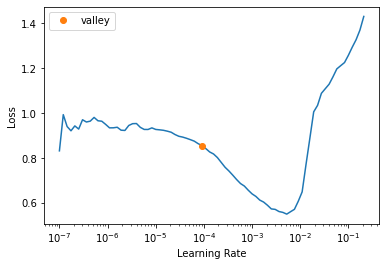

In [63]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fit_one_cycle(2, 3e-4)
learn.unfreeze()
learn.lr_find()

Trains the model after cleaning and using the learning rate found

In [64]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fit_one_cycle(1, 3e-4)
learn.unfreeze()
learn.fit_one_cycle(5, lr_max=slice(1e-5,1e-3))

epoch,train_loss,valid_loss,error_rate,time
0,2.241535,1.017497,0.404624,00:37


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


epoch,train_loss,valid_loss,error_rate,time
0,1.232308,0.187083,0.046243,00:37
1,0.735213,0.136725,0.040462,00:37
2,0.504382,0.136223,0.028902,00:37
3,0.372368,0.116441,0.034682,00:37
4,0.295329,0.115883,0.034682,00:37


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Was able to achieve 0.11 validation loss and 0.03 error rate with the same number of cycles

Saves the model and reloads it

In [65]:
learn.export()

In [66]:
path = Path()
learn_inf = load_learner(path/'export.pkl')

Makes a widget that allows user to upload images

In [67]:
out_pl = widgets.Output()
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

In [71]:
btn_run = widgets.Button(description='Classify')
btn_run.on_click(on_click_classify)
btn_upload = widgets.FileUpload()
lbl_pred = widgets.Label()

VBox([widgets.Label('Upload a pic of a bear.'),
      widgets.Label('Classifies Panda, Grizzly, Black, Teddy or Polar bears.'), 
      btn_upload, btn_run, out_pl, lbl_pred])